In [1]:
import numpy as np
import matplotlib.pyplot as plt
import csv
from matplotlib import rc
from scipy import optimize
from scipy.optimize import curve_fit
rc('font',**{'size':16})
rc('lines', **{'linewidth':3.0})
rc('savefig', **{'facecolor':'white'})
rc('axes', **{'labelsize':16})
rc('xtick', **{'direction':'in', 'top':True, 'minor.visible':True})
rc('ytick', **{'direction':'in', 'right':True, 'minor.visible':True})

In [ ]:

plt.errorbar(energy,perczero,yerr=err_zero,marker='o',linestyle='',label='Events Producing 0 Ecal Hits')
plt.errorbar(energy,percnotracks,yerr=err_notracks,marker='o',linestyle='',label='Events Producing 0 or 1 Ecal Hits')
plt.legend()
# draw dotted lines in critical region
line1 = np.full(2,0.03)
line2 = np.full(2,0.08)
region = [0,0.33]
plt.plot(line1,region,'--',color='black',linewidth=2)
plt.plot(line2,region,'--',color='black',linewidth=2)
print("Notice log scale for x. Notice huge jump. What's going on with error bars?")

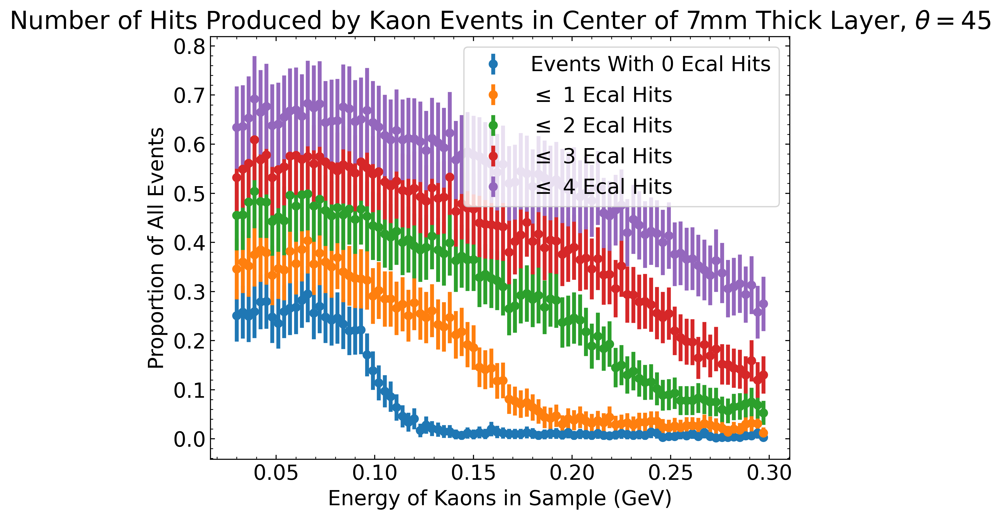

In [42]:
# import data
data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/cutoffs_singlecase.txt',delimiter=',',dtype=str)
# first column are names
name = data[0:,0]
entries = len(name)
# energy packed into string
energy = np.zeros(entries)
for i in range(len(name)):
    thisname = name[i]
    # clean up shorter entries such as 0.3gev
    try:
        energy[i] = thisname[14:19]
    except ValueError:
        energy[i] = thisname[14:18]

# reload data with dtype float
data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/cutoffs_singlecase.txt',delimiter=',',dtype=float)

f0 = data[0:,1]
f0e = np.sqrt(f0/entries)
f1 = data[0:,2];
f1e = np.sqrt(f1/entries)
f2 = data[0:,3]
f2e = np.sqrt(f2/entries)
f3 = data[0:,4]
f3e = np.sqrt(f3/entries)
f4 = data[0:,5]
f4e = np.sqrt(f4/entries)

plt.figure(figsize=(8,6),dpi=400)
plt.ylabel("Proportion of All Events")
plt.xlabel("Energy of Kaons in Sample (GeV)")
plt.title(r"Number of Hits Produced by Kaon Events in Center of 7mm Thick Layer, $\theta = 45$")
plt.errorbar(energy,f0,yerr=f0e,marker='o',linestyle='',label='Events With 0 Ecal Hits')
plt.errorbar(energy,f1,yerr=f1e,marker='o',linestyle='',label=r'$\leq$ 1 Ecal Hits')
plt.errorbar(energy,f2,yerr=f2e,marker='o',linestyle='',label=r'$\leq$ 2 Ecal Hits')
plt.errorbar(energy,f3,yerr=f3e,marker='o',linestyle='',label=r'$\leq$ 3 Ecal Hits')
plt.errorbar(energy,f4,yerr=f4e,marker='o',linestyle='',label=r'$\leq$ 4 Ecal Hits')
plt.legend()

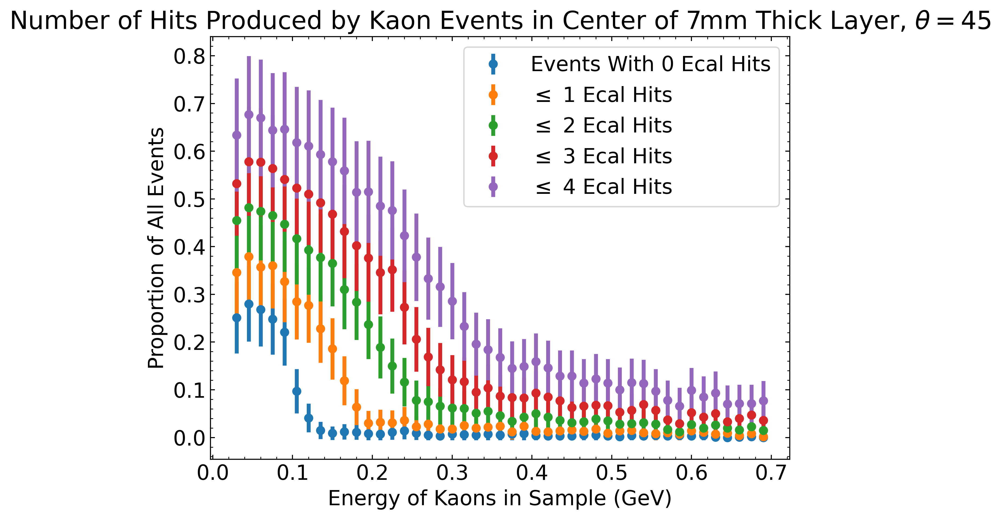

In [62]:
# import data
data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/new_cutoffs_singlecase.txt',delimiter=',',dtype=str)
# first column are names
name = data[0:,0]
entries = len(name)
# energy packed into string
energy = np.zeros(entries)
for i in range(len(name)):
    thisname = name[i]
    # clean up shorter entries such as 0.3gev
    try:
        energy[i] = thisname[14:19]
    except ValueError:
        try:
            energy[i] = thisname[14:18]
        except ValueError:
            energy[i] = thisname[14:17]

# reload data with dtype float
data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/new_cutoffs_singlecase.txt',delimiter=',',dtype=float)

f0 = data[0:,1]
f0e = np.sqrt(f0/entries)
f1 = data[0:,2];
f1e = np.sqrt(f1/entries)
f2 = data[0:,3]
f2e = np.sqrt(f2/entries)
f3 = data[0:,4]
f3e = np.sqrt(f3/entries)
f4 = data[0:,5]
f4e = np.sqrt(f4/entries)

plt.figure(figsize=(8,6),dpi=400)
plt.ylabel("Proportion of All Events")
plt.xlabel("Energy of Kaons in Sample (GeV)")
plt.title(r"Number of Hits Produced by Kaon Events in Center of 7mm Thick Layer, $\theta = 45$")
plt.errorbar(energy,f0,yerr=f0e,marker='o',linestyle='',label='Events With 0 Ecal Hits')
plt.errorbar(energy,f1,yerr=f1e,marker='o',linestyle='',label=r'$\leq$ 1 Ecal Hits')
plt.errorbar(energy,f2,yerr=f2e,marker='o',linestyle='',label=r'$\leq$ 2 Ecal Hits')
plt.errorbar(energy,f3,yerr=f3e,marker='o',linestyle='',label=r'$\leq$ 3 Ecal Hits')
plt.errorbar(energy,f4,yerr=f4e,marker='o',linestyle='',label=r'$\leq$ 4 Ecal Hits')
plt.legend()

In [64]:
# write some code to determine the cutoffs for this data
for i in range(entries):
    if f0[i] < 0.05:
        f0thresh = energy[i]
        break

for i in range(entries):
    if f1[i] < 0.05:
        f1thresh = energy[i]
        break

for i in range(entries):
    if f2[i] < 0.05:
        f2thresh = energy[i]
        break
        
for i in range(entries):
    if f3[i] < 0.05:
        f3thresh = energy[i]
        break

print(f0thresh,f1thresh,f2thresh,f3thresh)

0.12 0.195 0.36 0.57


chisq = 11.380167364646514 df = 14
chisq2 = 6.851722214256523 df = 14


(0.0, 500.0)

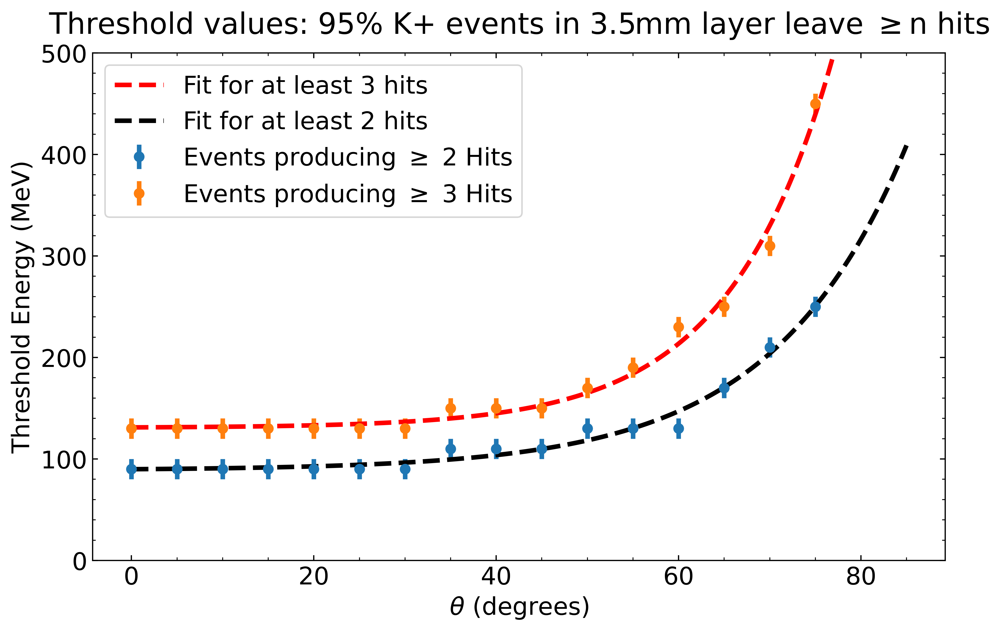

In [3]:
# sort through 19 text files, and find the thresholds for each of them. make a function

def find_threshholds(file,cutoff):
    # import data
    data = np.genfromtxt(file,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        try:
            energy[i] = thisname[14:19]
        except ValueError:
            try:
                energy[i] = thisname[14:18]
            except ValueError:
                energy[i] = thisname[14:17]

    # reload data with dtype float
    data = np.genfromtxt(file,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f1 = data[0:,2]
    f2 = data[0:,3]
    f3 = data[0:,4]
    f4 = data[0:,4]
    
    f0thresh = -1 # bad answer, use as error protection
    f1thresh = -1
    f2thresh = -1
    f3thresh = -1
    f4thresh = -1
    
    cutoff
    for i in range(entries):
        if f0[i] < cutoff:
            f0thresh = energy[i]
            break

    for i in range(entries):
        if f1[i] < cutoff:
            f1thresh = energy[i]
            break

    for i in range(entries):
        if f2[i] < cutoff:
            f2thresh = energy[i]
            break

    for i in range(entries):
        if f3[i] < cutoff:
            f3thresh = energy[i]
            break
            
    for i in range(entries):
        if f4[i] < cutoff:
            f4thresh = energy[i]
            break    
    
    return (f0thresh, f1thresh, f2thresh, f3thresh, f4thresh)

thetas = np.arange(0,80,5)


# list of thresholds @ all angles for 5% confidence level.
f0s_5 = []
f1s_5 = []
f2s_5 = []
f3s_5 = []
f4s_5 = []

error = [10] * len(thetas) # from spacing between energies in the sample.

for i in range(len(thetas)):
    extension = str(thetas[i]) + "_numhits.txt"
    filename = '/Users/chris/Desktop/ldmx/ldmx_files/cutoffs_radians/' + extension
    
    t0, t1, t2, t3, t4 = find_threshholds(filename,0.05)
    f0s_5.append(t0*1000)
    f1s_5.append(t1*1000)
    f2s_5.append(t2*1000)
    f3s_5.append(t3*1000)
    f4s_5.append(t4*1000)
    
def exp(x,A,b,h):
    return A*np.exp(b*x)+h

p0 = [0.6,0.08,100]
par, cov = curve_fit(exp,thetas,f2s_5,sigma=error,p0=p0,absolute_sigma=True)
par2, cov2 = curve_fit(exp,thetas,f1s_5,sigma=error,p0=p0,absolute_sigma=True)

Nexp = exp(thetas, *par)
Nexp2 = exp(thetas, *par2)

r = f2s_5 - Nexp
r2 = f1s_5 - Nexp2

chisq = np.sum((r/error)**2)
chisq2 = np.sum((r2/error)**2)
df = len(thetas) - 2
print("chisq =",chisq,"df =",df)
print("chisq2 =",chisq2,"df =",df)


 #make plot for 5% confidence level
plt.figure(figsize=(10,6),dpi=500)
#plt.errorbar(thetas,f0s_5,yerr=error,linestyle='',marker='o',label="0 Hits")
plt.errorbar(thetas,f1s_5,yerr=error,linestyle='',marker='o',label=r'Events producing $\geq$ 2 Hits')
plt.errorbar(thetas,f2s_5,yerr=error,linestyle='',marker='o',label=r'Events producing $\geq$ 3 Hits')
#plt.errorbar(thetas,f3s_5,yerr=error,linestyle='',marker='o',label=r'$\leq$ 3 Hits')
#plt.errorbar(thetas,f4s_5,yerr=error,linestyle='',marker='o',label=r'$\leq$ 3 Hits')
 #plot fit
xvals = np.linspace(0,85,1000)
yvals = exp(xvals,par[0],par[1],par[2])
yvals2 = exp(xvals,par2[0],par2[1],par2[2])
plt.plot(xvals,yvals,linestyle='--',color='red',label="Fit for at least 3 hits")
plt.plot(xvals,yvals2,linestyle='--',color='black',label="Fit for at least 2 hits")
plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Threshold Energy (MeV)")
plt.title(r"Threshold values: 95% K+ events in 3.5mm layer leave $\geq$n hits",y=1.02)
plt.legend(loc='upper left')
plt.ylim(0,500)
#plt.savefig('/Users/chris/Desktop/ldmx/figs_for_report/threshold_evstheta.png')

(0.0, 0.5)

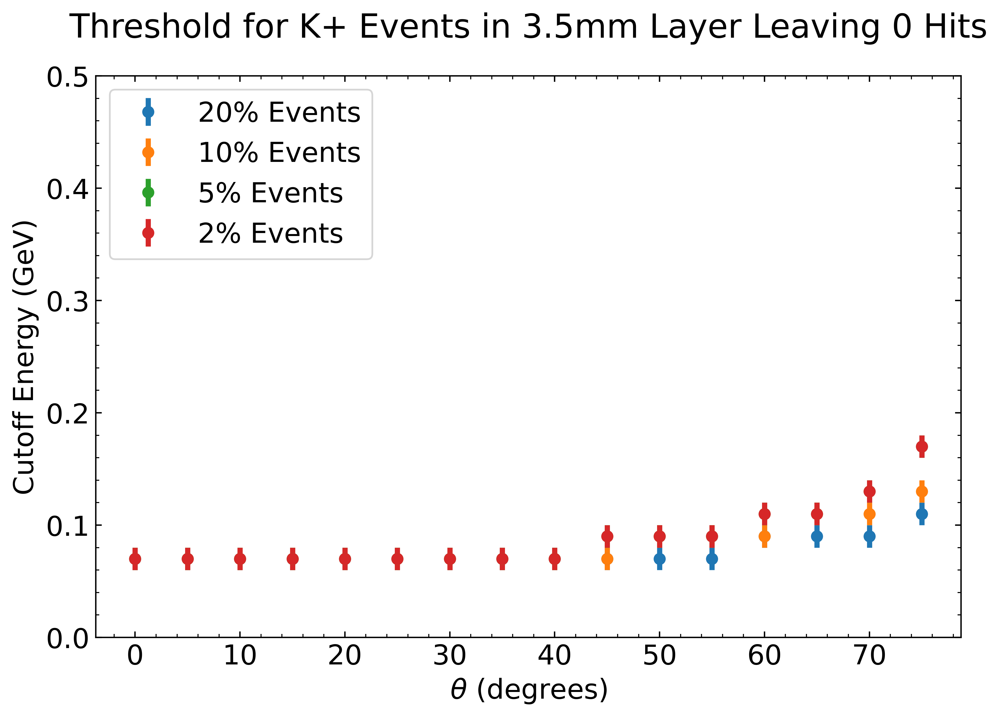

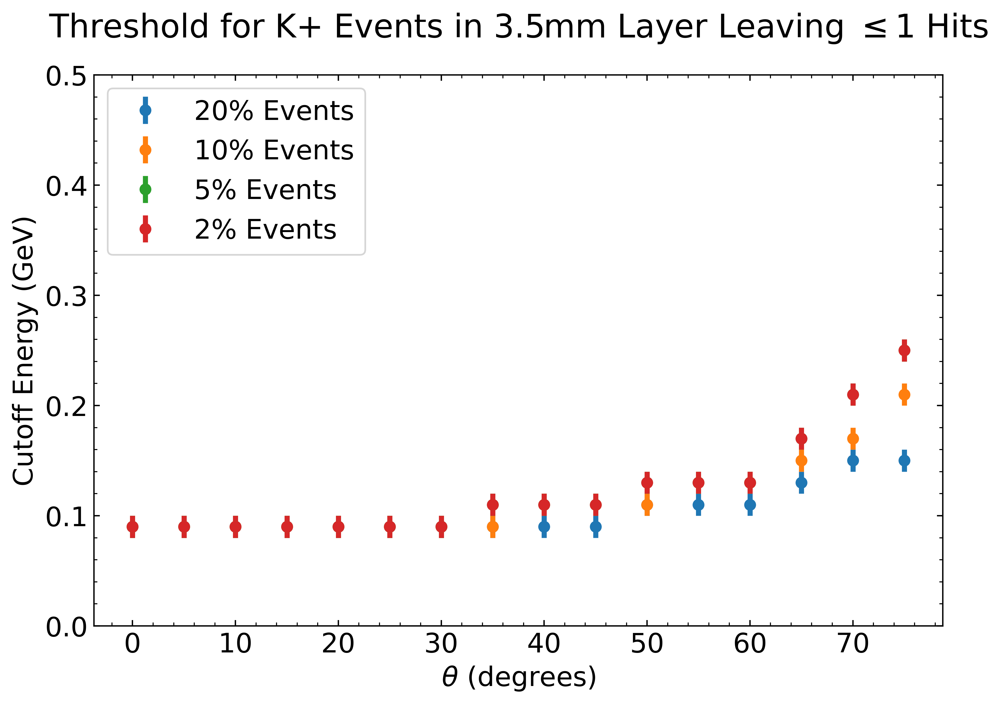

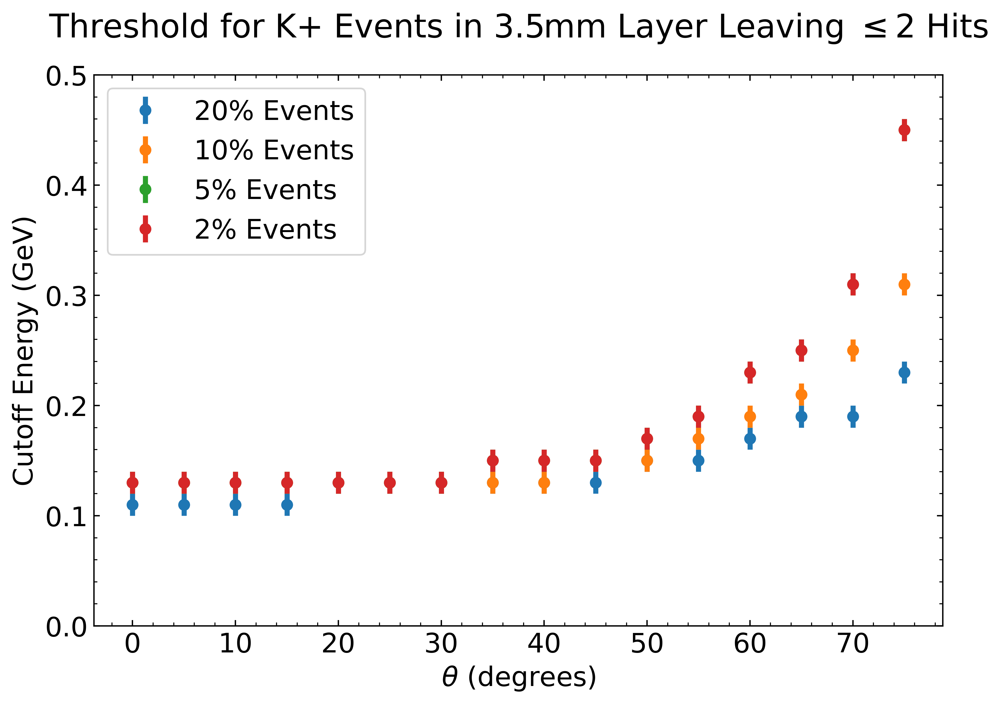

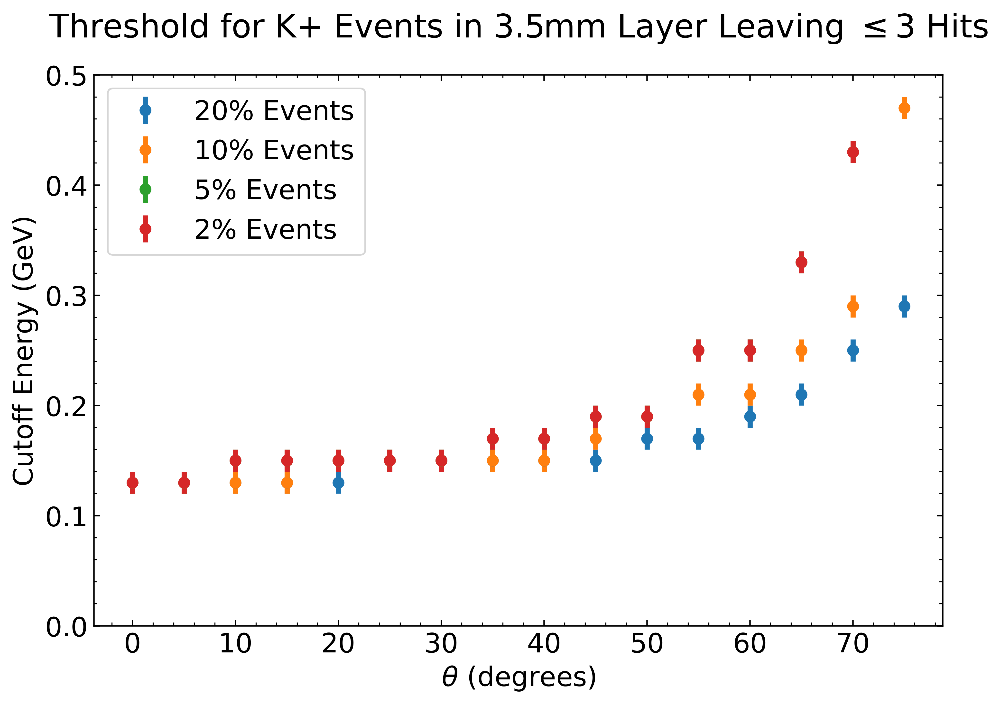

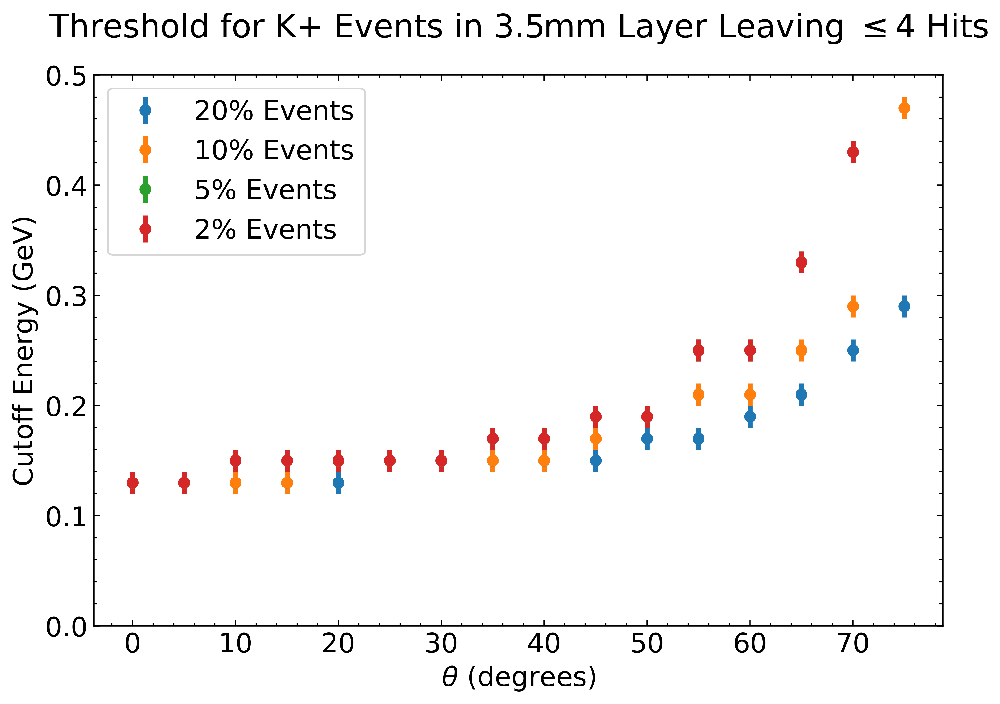

In [21]:
# in this one we'll make the plots for each num hits and scale by confidence level.

# 0 hits
plt.figure(figsize=(9,6),dpi=500)
plt.errorbar(thetas,f0s_20,yerr=error,linestyle='',marker='o',label="20% Events")
plt.errorbar(thetas,f0s_10,yerr=error,linestyle='',marker='o',label=r'10% Events')
plt.errorbar(thetas,f0s_5,yerr=error,linestyle='',marker='o',label=r'5% Events')
plt.errorbar(thetas,f0s_2,yerr=error,linestyle='',marker='o',label=r'2% Events')

plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Cutoff Energy (GeV)")
plt.title("Threshold for K+ Events in 3.5mm Layer Leaving 0 Hits",y=1.05)
plt.ylim(0,0.5)
plt.legend(loc='upper left')

# le 1 hit
plt.figure(figsize=(9,6),dpi=500)
plt.errorbar(thetas,f1s_20,yerr=error,linestyle='',marker='o',label="20% Events")
plt.errorbar(thetas,f1s_10,yerr=error,linestyle='',marker='o',label=r'10% Events')
plt.errorbar(thetas,f1s_5,yerr=error,linestyle='',marker='o',label=r'5% Events')
plt.errorbar(thetas,f1s_2,yerr=error,linestyle='',marker='o',label=r'2% Events')

plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Cutoff Energy (GeV)")
plt.title(r"Threshold for K+ Events in 3.5mm Layer Leaving $\leq$1 Hits",y=1.05)
plt.legend(loc='upper left')
plt.ylim(0,0.5)

# le 2 hits
plt.figure(figsize=(9,6),dpi=500)
plt.errorbar(thetas,f2s_20,yerr=error,linestyle='',marker='o',label="20% Events")
plt.errorbar(thetas,f2s_10,yerr=error,linestyle='',marker='o',label=r'10% Events')
plt.errorbar(thetas,f2s_5,yerr=error,linestyle='',marker='o',label=r'5% Events')
plt.errorbar(thetas,f2s_2,yerr=error,linestyle='',marker='o',label=r'2% Events')

plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Cutoff Energy (GeV)")
plt.title(r"Threshold for K+ Events in 3.5mm Layer Leaving $\leq$2 Hits",y=1.05)
plt.ylim(0,0.5)
plt.legend(loc='upper left')
             
# le 3 hits
plt.figure(figsize=(9,6),dpi=500)
plt.errorbar(thetas,f3s_20,yerr=error,linestyle='',marker='o',label="20% Events")
plt.errorbar(thetas,f3s_10,yerr=error,linestyle='',marker='o',label=r'10% Events')
plt.errorbar(thetas,f3s_5,yerr=error,linestyle='',marker='o',label=r'5% Events')
plt.errorbar(thetas,f3s_2,yerr=error,linestyle='',marker='o',label=r'2% Events')

plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Cutoff Energy (GeV)")
plt.title(r"Threshold for K+ Events in 3.5mm Layer Leaving $\leq$3 Hits",y=1.05)
plt.legend(loc='upper left')
plt.ylim(0,0.5)

# le 4 hits
plt.figure(figsize=(9,6),dpi=500)
plt.errorbar(thetas,f4s_20,yerr=error,linestyle='',marker='o',label="20% Events")
plt.errorbar(thetas,f4s_10,yerr=error,linestyle='',marker='o',label=r'10% Events')
plt.errorbar(thetas,f4s_5,yerr=error,linestyle='',marker='o',label=r'5% Events')
plt.errorbar(thetas,f4s_2,yerr=error,linestyle='',marker='o',label=r'2% Events')

plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Cutoff Energy (GeV)")
plt.title(r"Threshold for K+ Events in 3.5mm Layer Leaving $\leq$4 Hits",y=1.05)
plt.legend(loc='upper left')
plt.ylim(0,0.5)

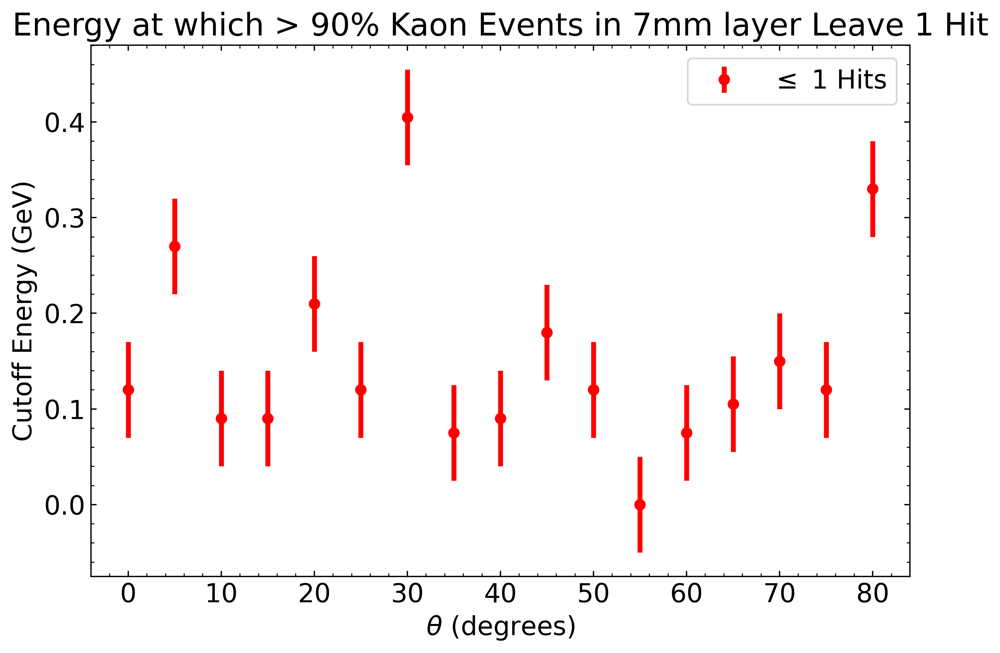

In [127]:
plt.figure(figsize=(9,6),dpi=400)
plt.errorbar(thetas,f1s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 1 Hits',color='red')
#plt.errorbar(thetas,f2s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 2 Hits')
#plt.errorbar(thetas,f3s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 3 Hits')
plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Cutoff Energy (GeV)")
plt.title("Energy at which > 90% Kaon Events in 7mm layer Leave 1 Hit")
plt.legend()

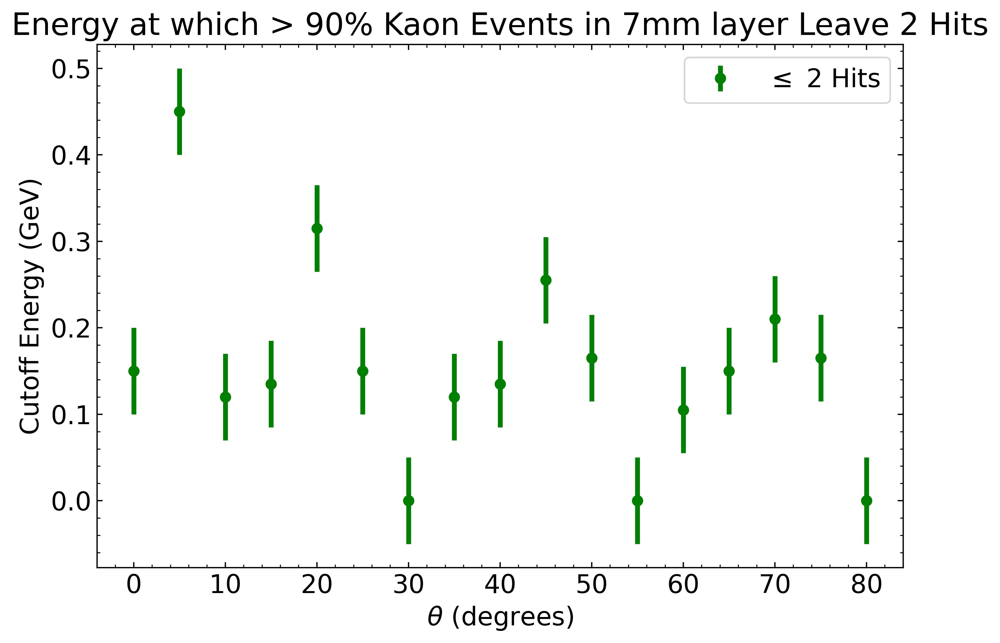

In [128]:
plt.figure(figsize=(9,6),dpi=400)
#plt.errorbar(thetas,f1s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 1 Hits',color='green')
plt.errorbar(thetas,f2s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 2 Hits',color='green')
#plt.errorbar(thetas,f3s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 3 Hits')
plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Cutoff Energy (GeV)")
plt.title("Energy at which > 90% Kaon Events in 7mm layer Leave 2 Hits")
plt.legend()

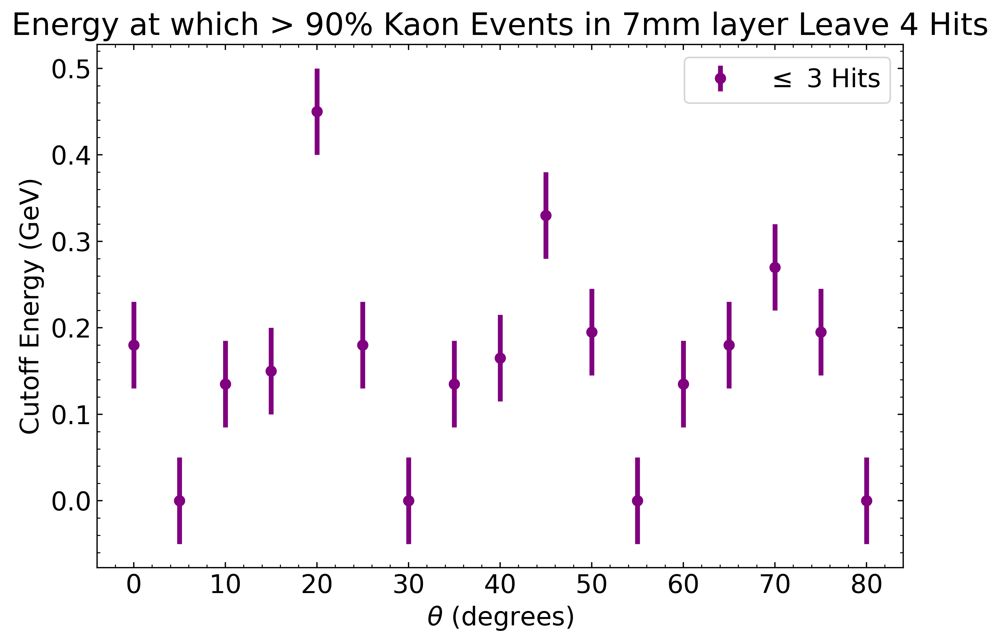

In [129]:
plt.figure(figsize=(9,6),dpi=400)
#plt.errorbar(thetas,f1s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 1 Hits',color='green')
#plt.errorbar(thetas,f2s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 2 Hits',color='green')
plt.errorbar(thetas,f3s,yerr=error,linestyle='',marker='o',label=r'$\leq$ 3 Hits',color='purple')
plt.xlabel(r"$\theta$ (degrees)")
plt.ylabel("Cutoff Energy (GeV)")
plt.title("Energy at which > 90% Kaon Events in 7mm layer Leave 4 Hits")
plt.legend()

1011


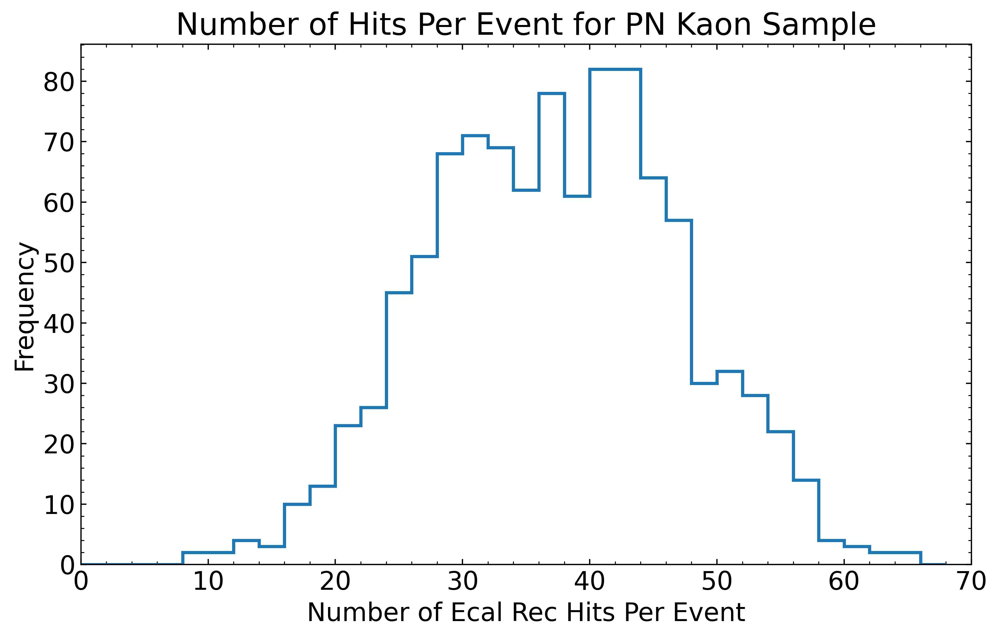

In [3]:
# create histogram for num hits from danyi file
data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/numhits_4gev_1e_tskim_v12_kaons_ldmx-det-v12_bdt_hcal_skimmed.root.txt',delimiter=',')
plt.figure(figsize=(10,6),dpi=400)
bins = np.arange(0,70,2)
plt.hist(data,bins = bins,histtype='step',linewidth=2)
plt.xlabel("Number of Ecal Rec Hits Per Event")
plt.ylabel("Frequency")
plt.xlim(0,70)
plt.title("Number of Hits Per Event for PN Kaon Sample")
print(len(data))

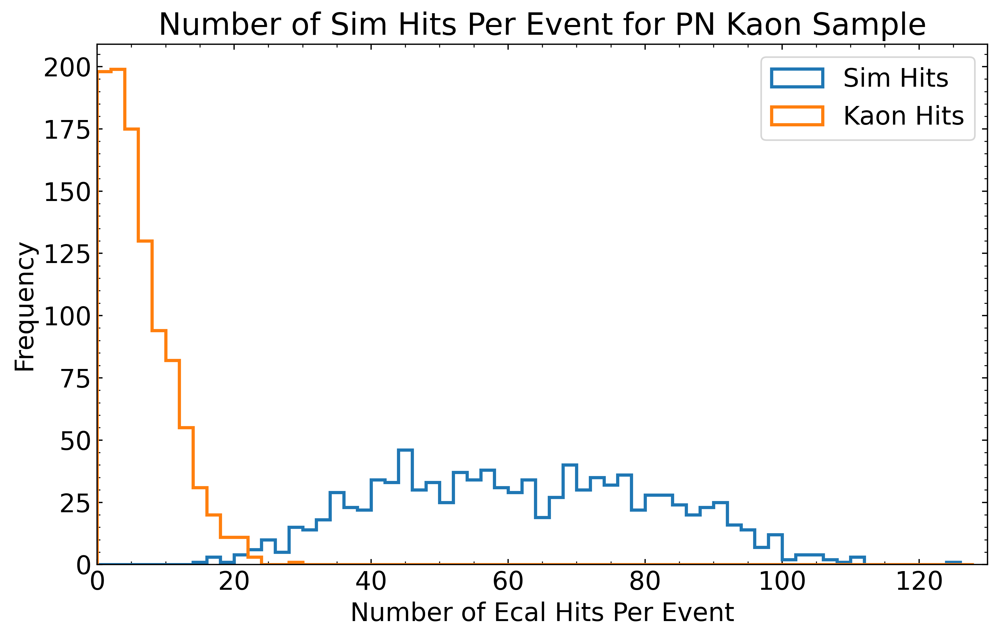

In [43]:
# create histogram for num sim hits from danyi file
data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/numsimhitsperevent_danyisample.txt',delimiter=',')
datakaons = np.genfromtxt('/Users/chris/Desktop/ldmx_files/numkaonhitsperevent_danyisample.txt',delimiter=',')
plt.figure(figsize=(10,6),dpi=400)
plt.hist(data,bins = np.arange(0,130,2),histtype='step',linewidth=2,label='Sim Hits')
plt.hist(datakaons,bins = np.arange(0,130,2),histtype='step',linewidth=2,label='Kaon Hits')
plt.xlabel("Number of Ecal Hits Per Event")
plt.ylabel("Frequency")
plt.xlim(0,130)
plt.title("Number of Sim Hits Per Event for PN Kaon Sample")
plt.legend()

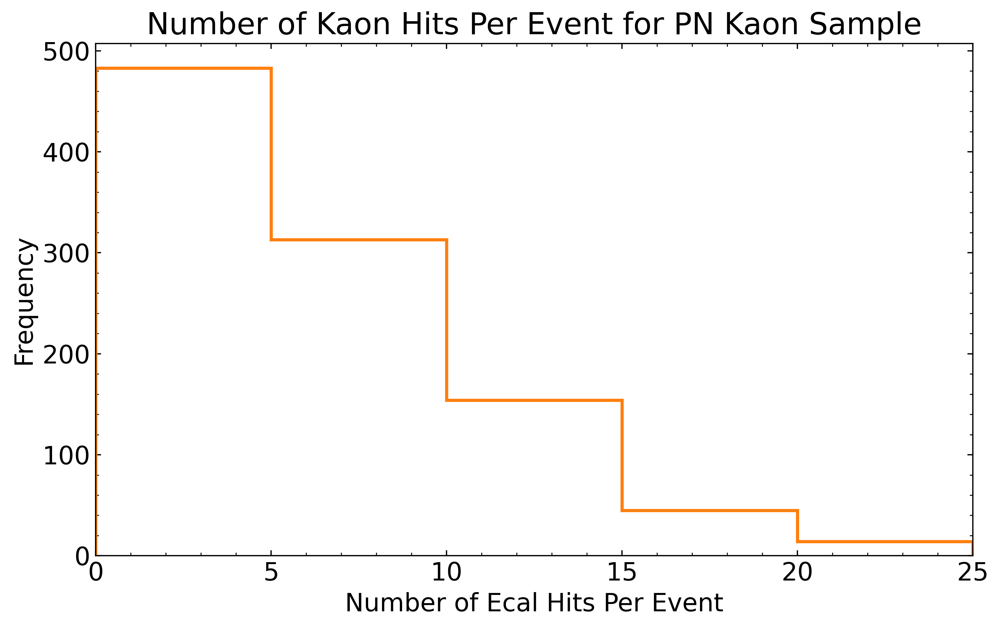

In [69]:
# create histogram for num sim hits from danyi file
data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/numsimhitsperevent_danyisample.txt',delimiter=',')
datakaons = np.genfromtxt('/Users/chris/Desktop/ldmx_files/numkaonhitsperevent_danyisample.txt',delimiter=',')
plt.figure(figsize=(10,6),dpi=400)
# plt.hist(data,bins = np.arange(0,130,3),histtype='step',linewidth=2,label='Sim Hits')
plt.hist(datakaons,bins = np.arange(0,40,5),histtype='step',linewidth=2,label='Kaon Hits',color='C1')
plt.xlabel("Number of Ecal Hits Per Event")
plt.ylabel("Frequency")
plt.xlim(0,25)
plt.title("Number of Kaon Hits Per Event for PN Kaon Sample")
print()

OSError: /Users/chris/Desktop/ldmx_files/85_numhits.txt not found.

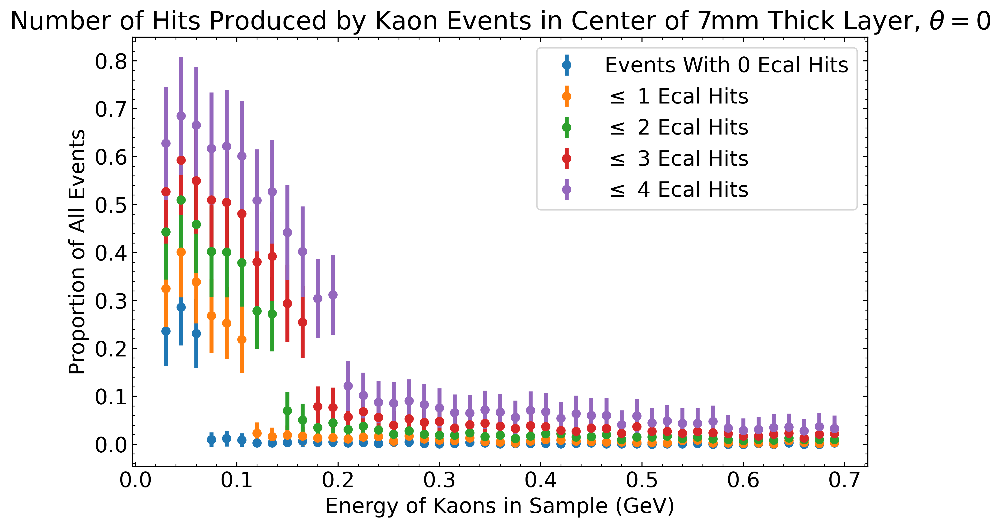

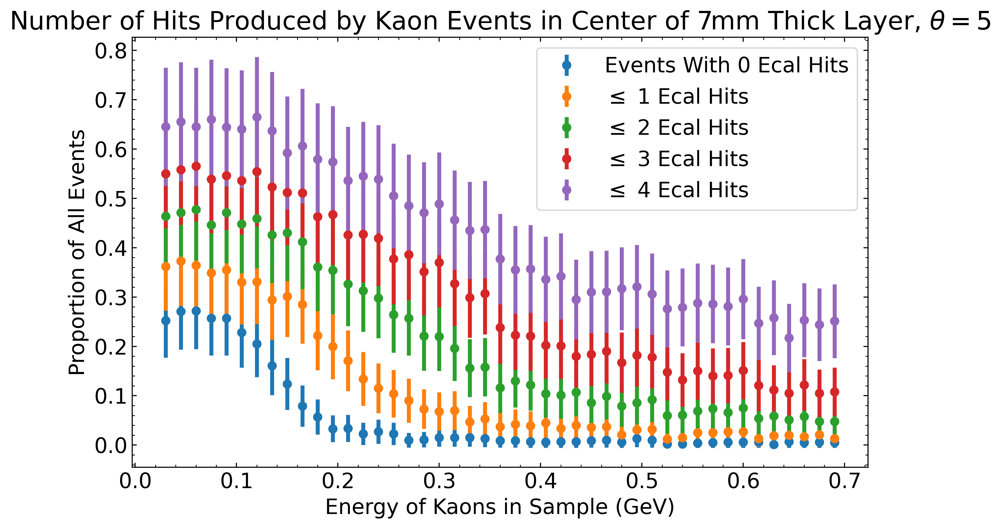

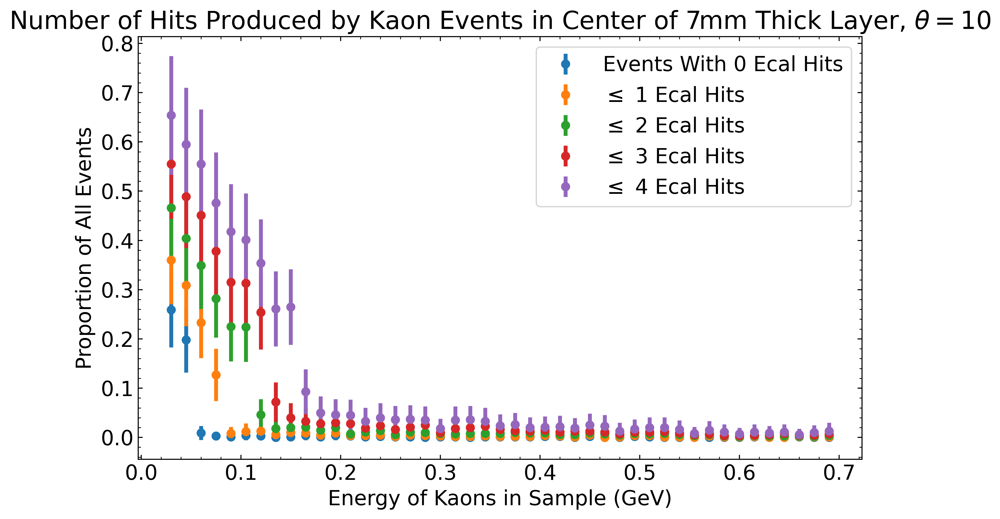

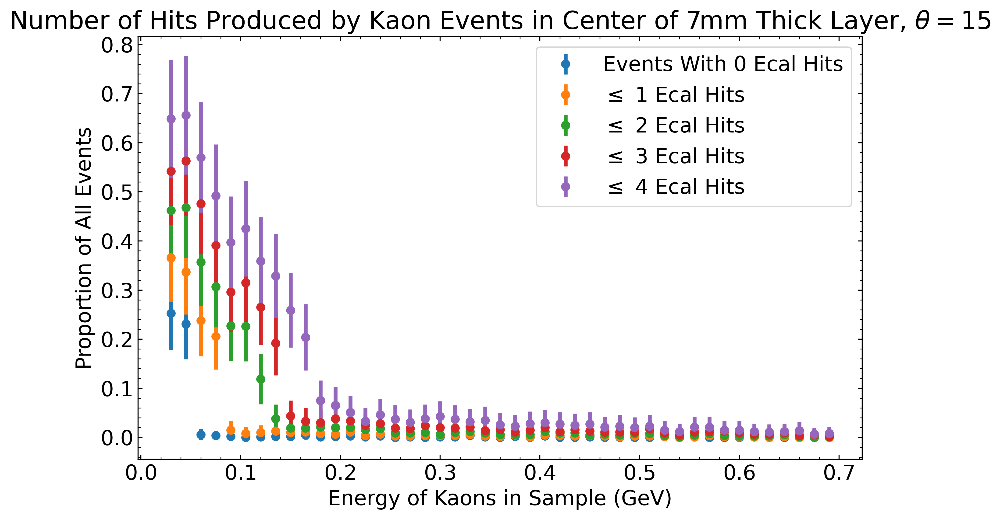

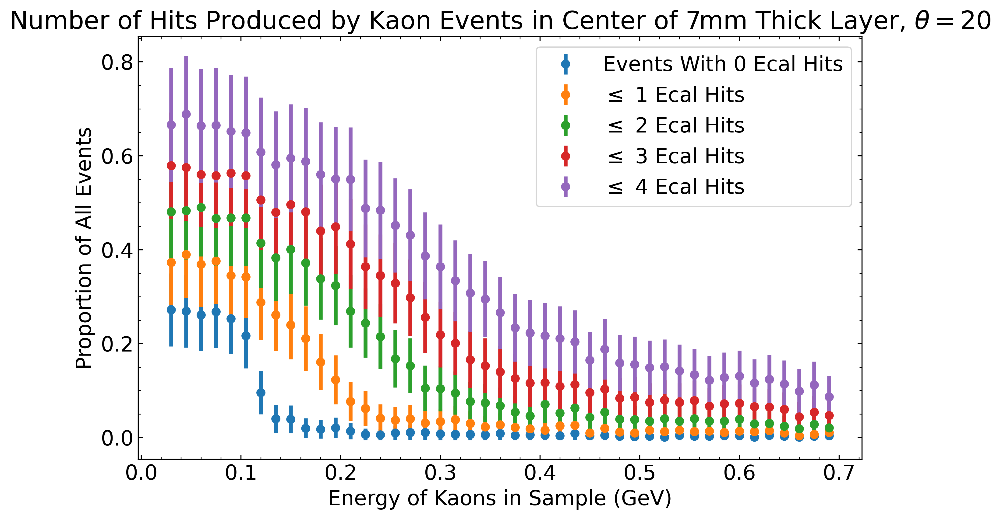

...

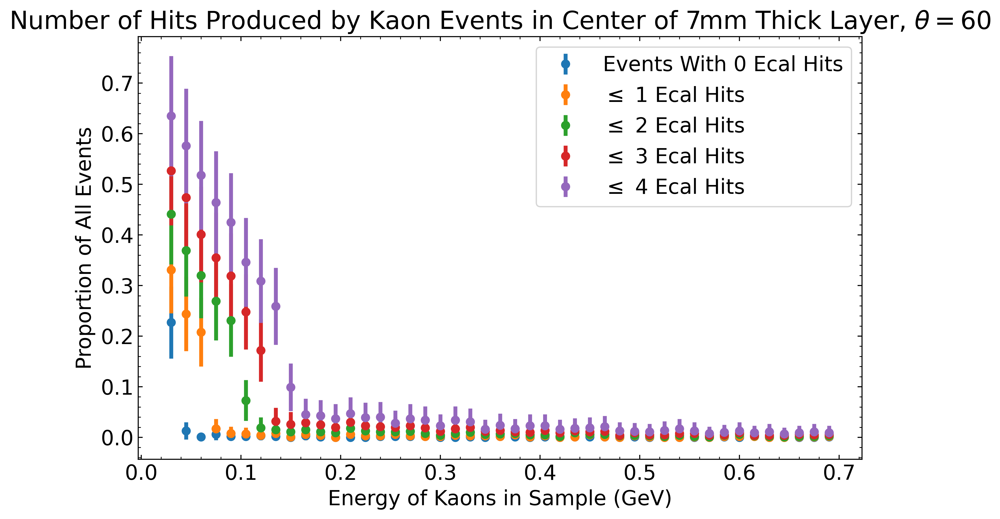

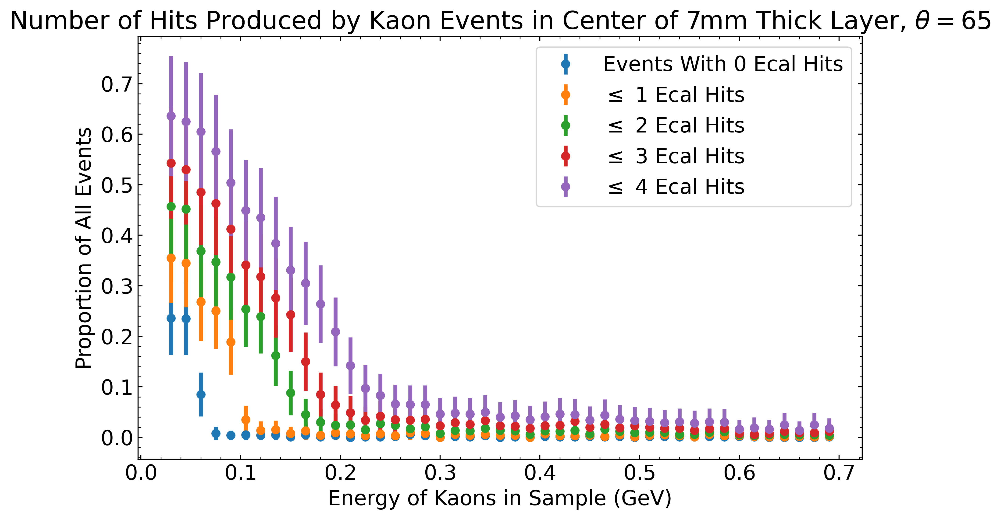

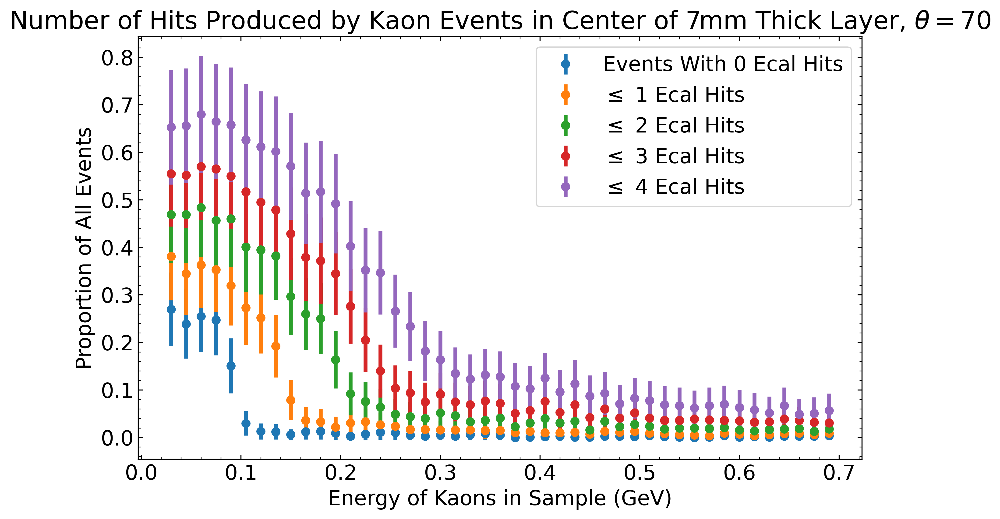

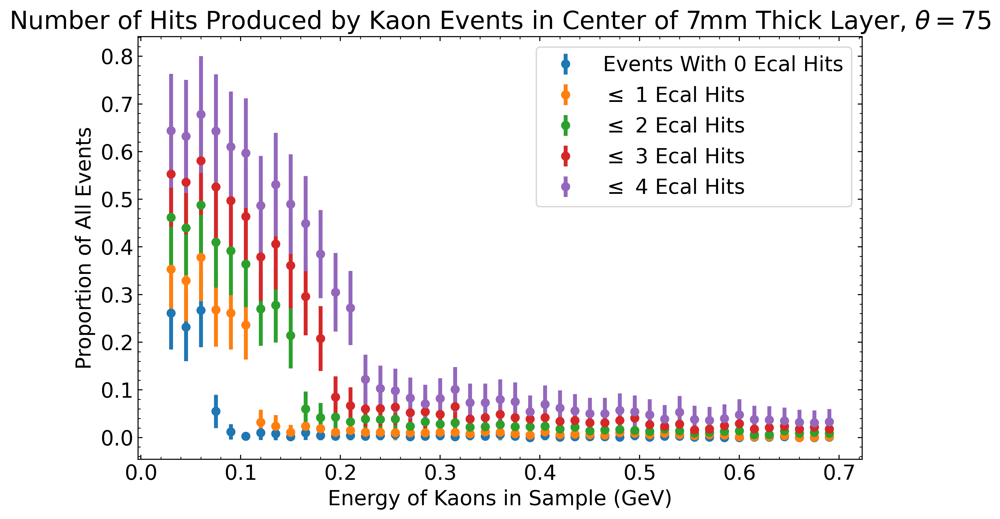

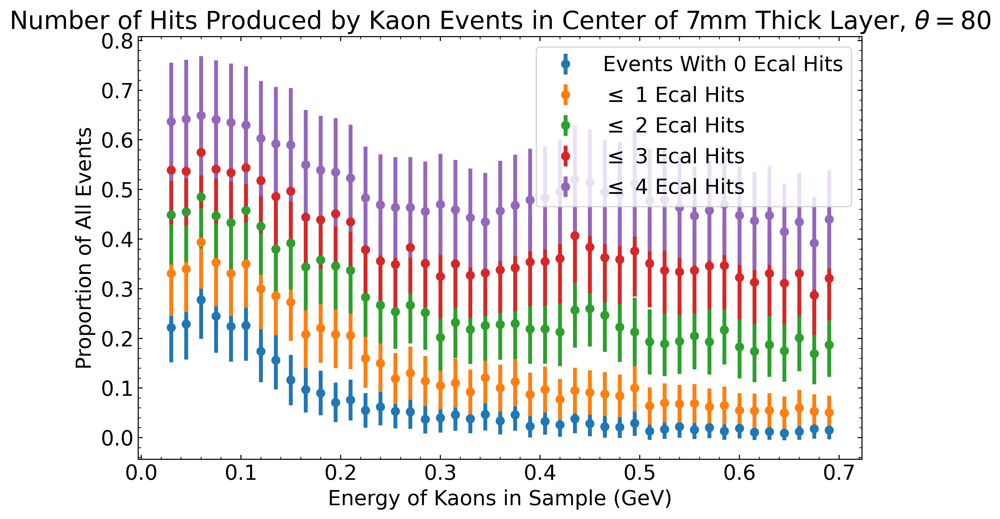

In [13]:

for i in range(0,90,5):
    theta = i
    # import data
    data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/%d_numhits.txt' % theta,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        try:
            energy[i] = thisname[14:19]
        except ValueError:
            try:
                energy[i] = thisname[14:18]
            except ValueError:
                try:
                    energy[i] = thisname[14:17]
                except ValueError:
                    energy[i] = thisname[14:16]

    # reload data with dtype float
    data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/%d_numhits.txt' % theta,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f0e = np.sqrt(f0/entries)
    f1 = data[0:,2];
    f1e = np.sqrt(f1/entries)
    f2 = data[0:,3]
    f2e = np.sqrt(f2/entries)
    f3 = data[0:,4]
    f3e = np.sqrt(f3/entries)
    f4 = data[0:,5]
    f4e = np.sqrt(f4/entries)

    plt.figure(figsize=(10,6),dpi=400)
    plt.ylabel("Proportion of All Events")
    plt.xlabel("Energy of Kaons in Sample (GeV)")
    plt.title(r"Number of Hits Produced by Kaon Events in Center of 7mm Thick Layer, $\theta = %d$" % theta)
    plt.errorbar(energy,f0,yerr=f0e,marker='o',linestyle='',label='Events With 0 Ecal Hits')
    plt.errorbar(energy,f1,yerr=f1e,marker='o',linestyle='',label=r'$\leq$ 1 Ecal Hits')
    plt.errorbar(energy,f2,yerr=f2e,marker='o',linestyle='',label=r'$\leq$ 2 Ecal Hits')
    plt.errorbar(energy,f3,yerr=f3e,marker='o',linestyle='',label=r'$\leq$ 3 Ecal Hits')
    plt.errorbar(energy,f4,yerr=f4e,marker='o',linestyle='',label=r'$\leq$ 4 Ecal Hits')
    plt.legend()
    plt.savefig("/Users/chris/Desktop/ldmx_plots/%d_degrees_Dlayer" % theta)

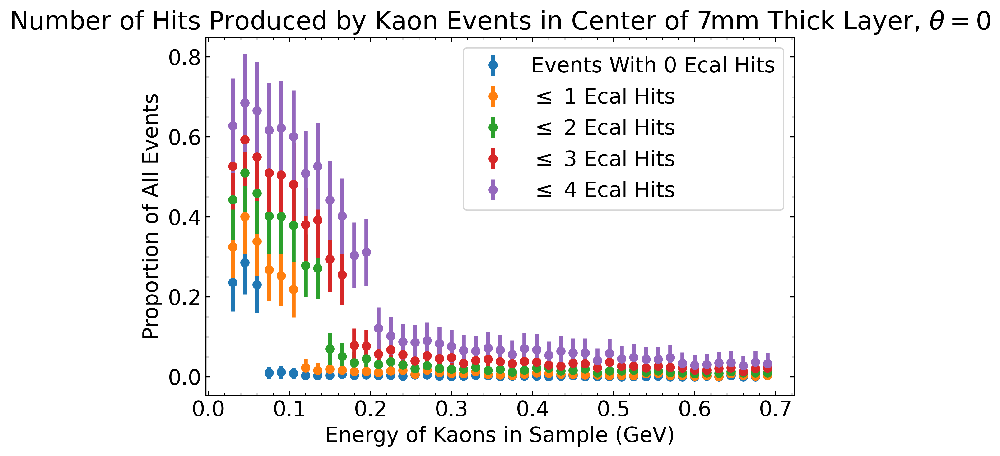

In [61]:
for i in range(1):
    theta = 0
    # import data
    data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/%d_numhits.txt' % theta,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        try:
            energy[i] = thisname[14:19]
        except ValueError:
            try:
                energy[i] = thisname[14:18]
            except ValueError:
                try:
                    energy[i] = thisname[14:17]
                except ValueError:
                    energy[i] = thisname[14:16]

    # reload data with dtype float
    data = np.genfromtxt('/Users/chris/Desktop/ldmx_files/%d_numhits.txt' % theta,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f0e = np.sqrt(f0/entries)
    f1 = data[0:,2];
    f1e = np.sqrt(f1/entries)
    f2 = data[0:,3]
    f2e = np.sqrt(f2/entries)
    f3 = data[0:,4]
    f3e = np.sqrt(f3/entries)
    f4 = data[0:,5]
    f4e = np.sqrt(f4/entries)

    plt.figure(figsize=(8,5),dpi=400)
    plt.ylabel("Proportion of All Events")
    plt.xlabel("Energy of Kaons in Sample (GeV)")
    plt.title(r"Number of Hits Produced by Kaon Events in Center of 7mm Thick Layer, $\theta = %d$" % theta)
    plt.errorbar(energy,f0,yerr=f0e,marker='o',linestyle='',label='Events With 0 Ecal Hits')
    plt.errorbar(energy,f1,yerr=f1e,marker='o',linestyle='',label=r'$\leq$ 1 Ecal Hits')
    plt.errorbar(energy,f2,yerr=f2e,marker='o',linestyle='',label=r'$\leq$ 2 Ecal Hits')
    plt.errorbar(energy,f3,yerr=f3e,marker='o',linestyle='',label=r'$\leq$ 3 Ecal Hits')
    plt.errorbar(energy,f4,yerr=f4e,marker='o',linestyle='',label=r'$\leq$ 4 Ecal Hits')
    plt.legend()
    # plt.savefig("/Users/chris/Desktop/%d_degrees" % theta)

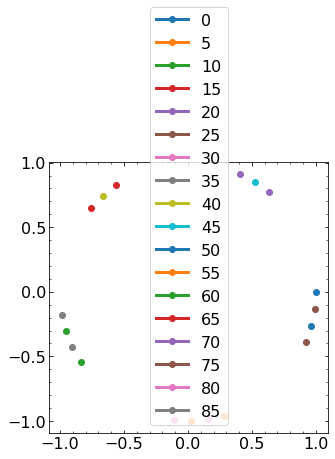

In [52]:
plt.figure(figsize = (5,5))

for i in range(0,90,5):
    radians = i
    degrees = 180*radians/np.pi
    plt.plot(np.cos(radians),np.sin(radians),marker='o',label='%d' % i)
    
plt.legend()

In [21]:
energyrange = np.arange(10,500,20)
print(len(energyrange))

25


In [51]:
a = np.degrees(20) - 3 * 360
print(a)

65.91559026164646


In [50]:
print(a)

1145.9155902616465


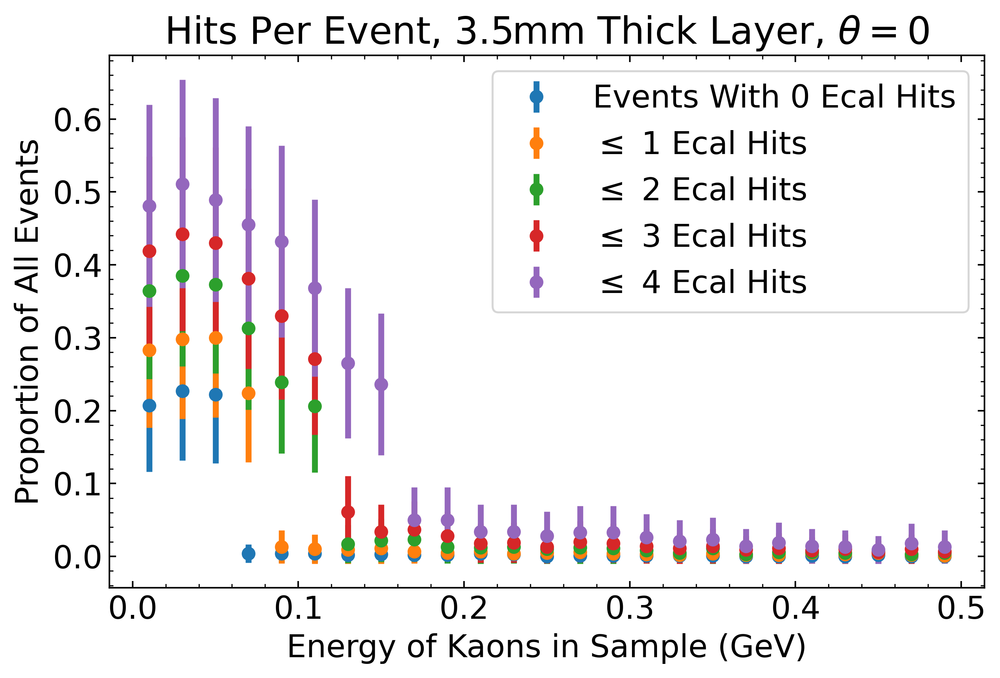

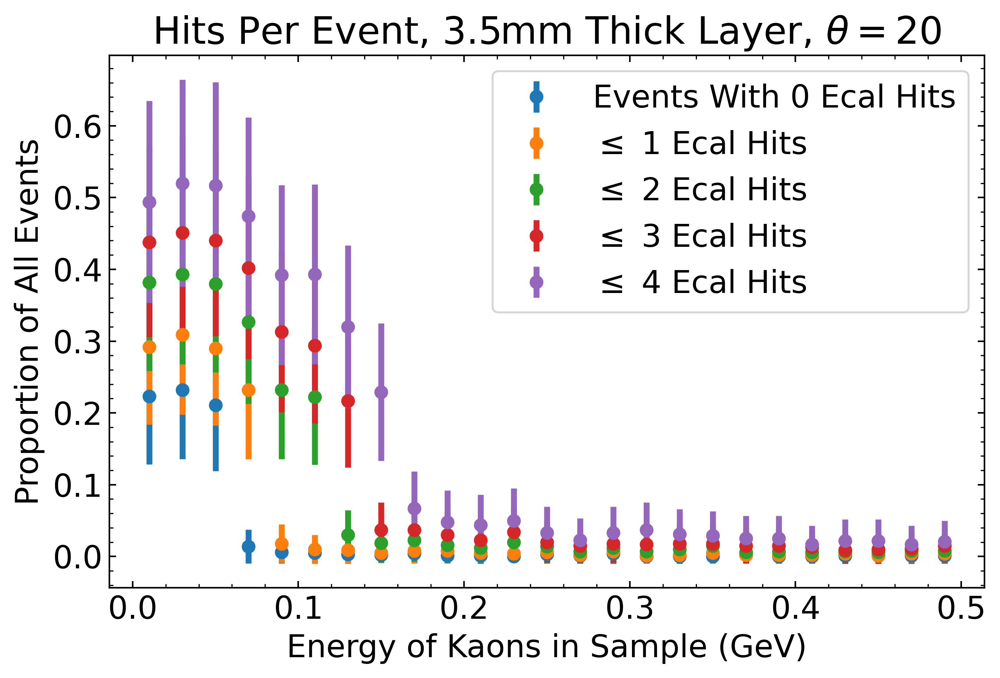

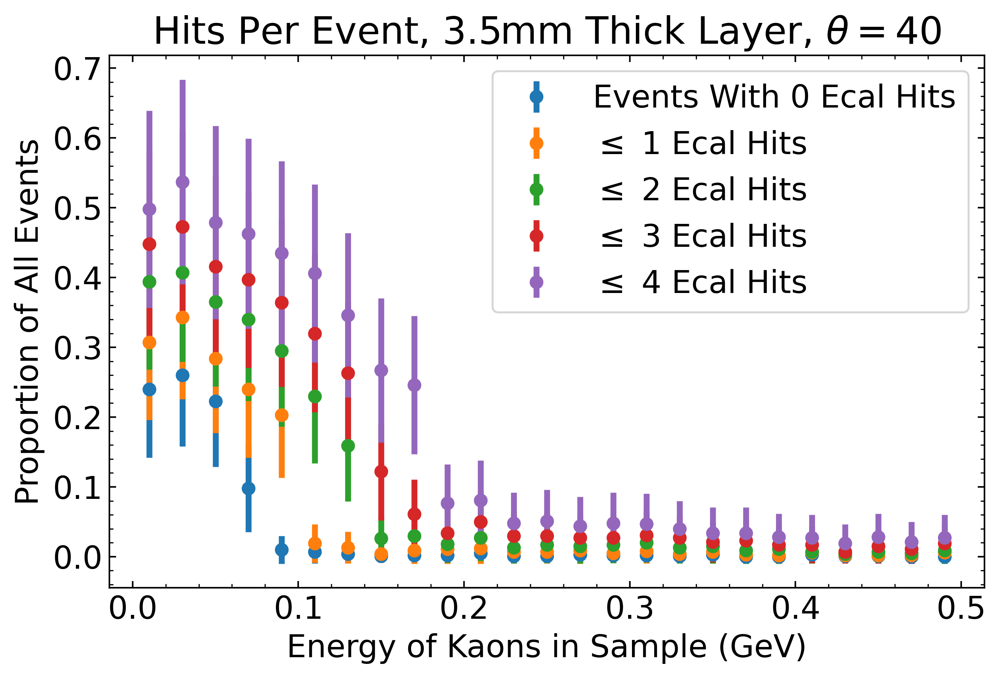

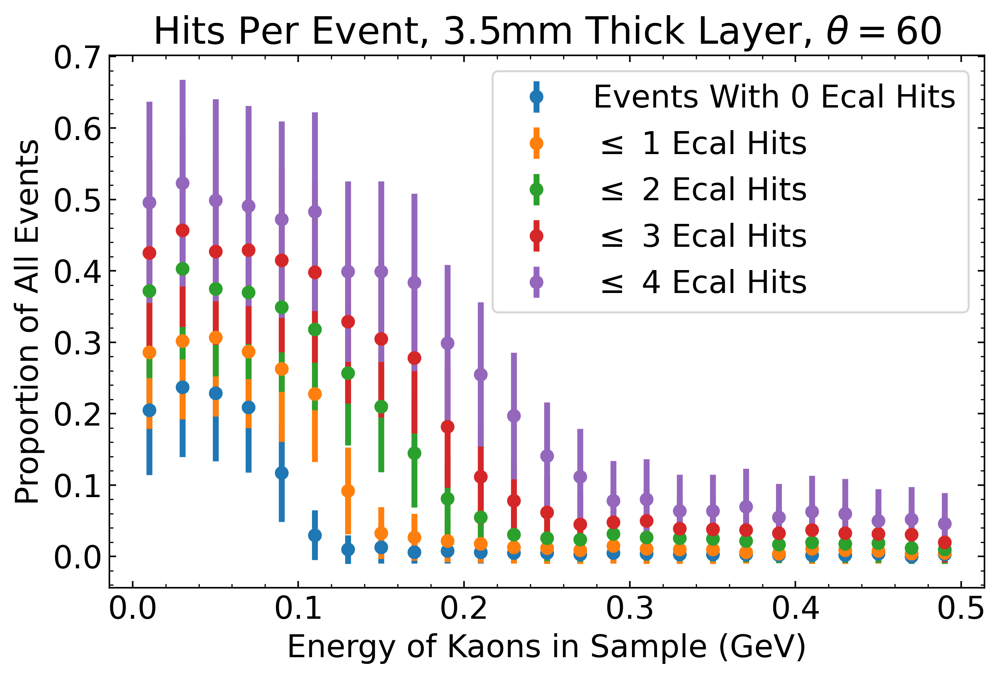

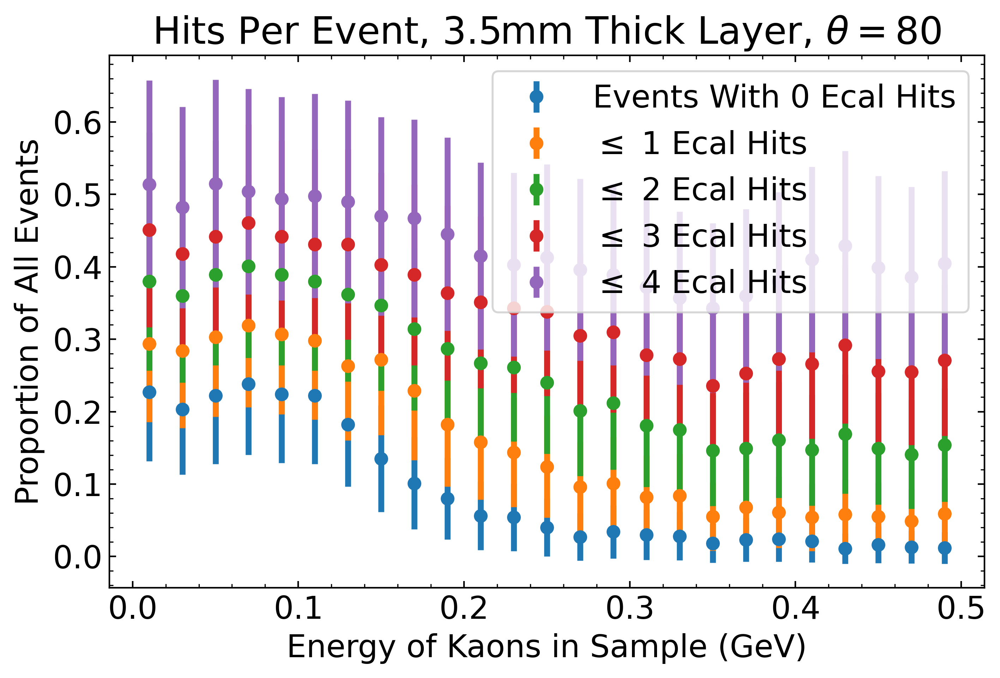

In [10]:
thetas = np.arange(0,100,20)
for i in range(len(thetas)):
    theta = thetas[i]
    # import data
    data = np.genfromtxt('/Users/chris/Desktop/dlayer_samples/%d_numhits_c.txt' % theta,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        energy[i] = thisname[14:18]

    # reload data with dtype float
    data = np.genfromtxt('/Users/chris/Desktop/dlayer_samples/%d_numhits_c.txt' % theta,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f0e = np.sqrt(f0/entries)
    f1 = data[0:,2];
    f1e = np.sqrt(f1/entries)
    f2 = data[0:,3]
    f2e = np.sqrt(f2/entries)
    f3 = data[0:,4]
    f3e = np.sqrt(f3/entries)
    f4 = data[0:,5]
    f4e = np.sqrt(f4/entries)

    plt.figure(figsize=(8,5),dpi=400)
    plt.ylabel("Proportion of All Events")
    plt.xlabel("Energy of Kaons in Sample (GeV)")
    plt.title(r"Hits Per Event, 3.5mm Thick Layer, $\theta = %d$" % theta)
    plt.errorbar(energy,f0,yerr=f0e,marker='o',linestyle='',label='Events With 0 Ecal Hits')
    plt.errorbar(energy,f1,yerr=f1e,marker='o',linestyle='',label=r'$\leq$ 1 Ecal Hits')
    plt.errorbar(energy,f2,yerr=f2e,marker='o',linestyle='',label=r'$\leq$ 2 Ecal Hits')
    plt.errorbar(energy,f3,yerr=f3e,marker='o',linestyle='',label=r'$\leq$ 3 Ecal Hits')
    plt.errorbar(energy,f4,yerr=f4e,marker='o',linestyle='',label=r'$\leq$ 4 Ecal Hits')
    plt.legend()
    plt.savefig("/Users/chris/Desktop/ldmx_plots/newplots_%d_degrees_clayer" % theta)

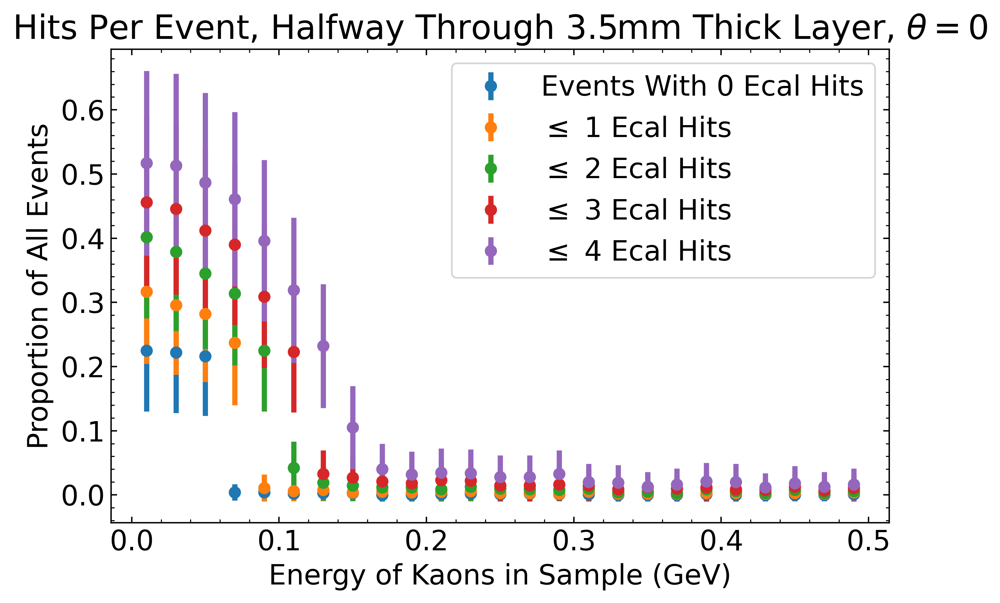

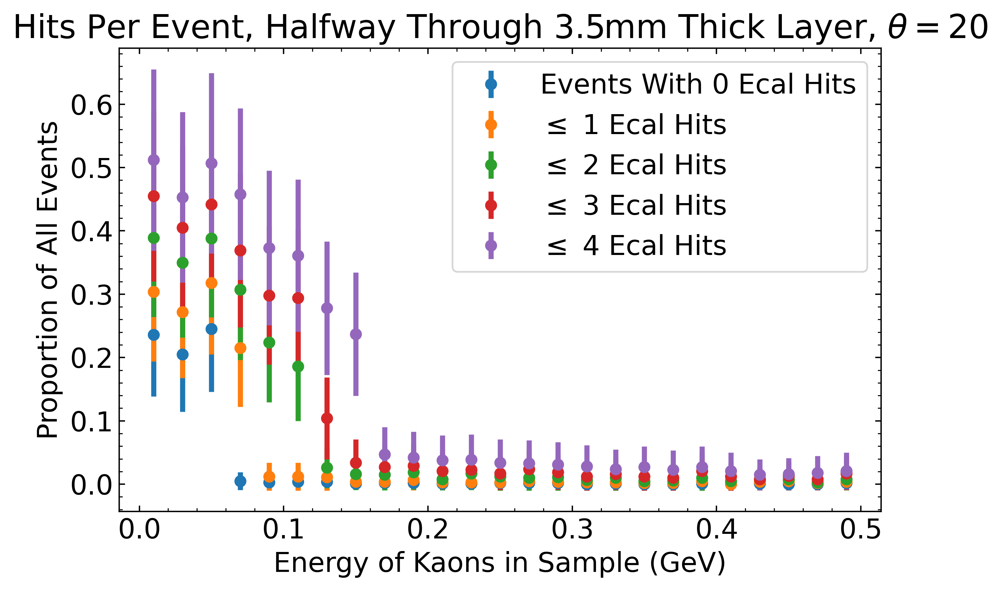

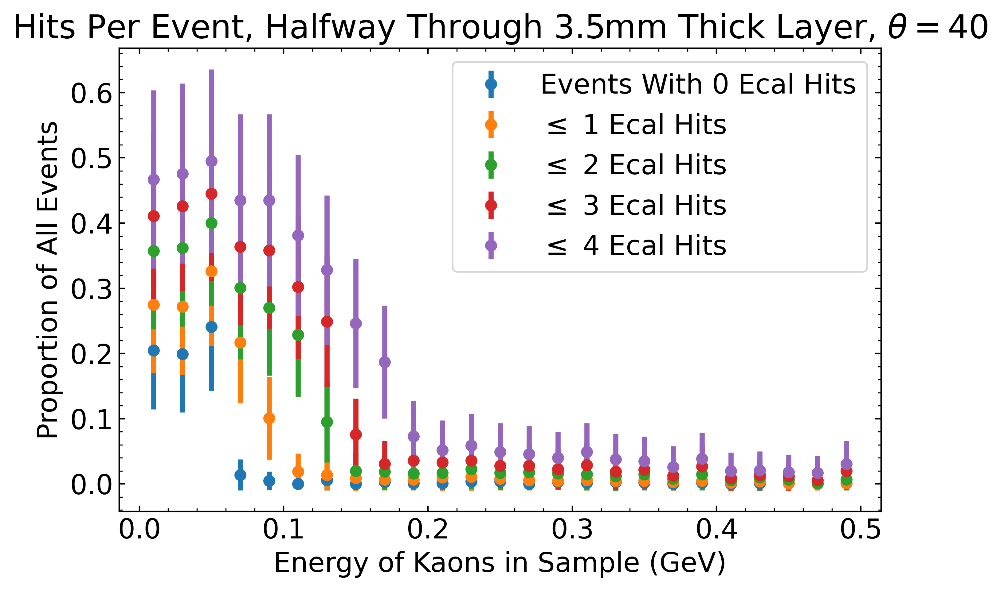

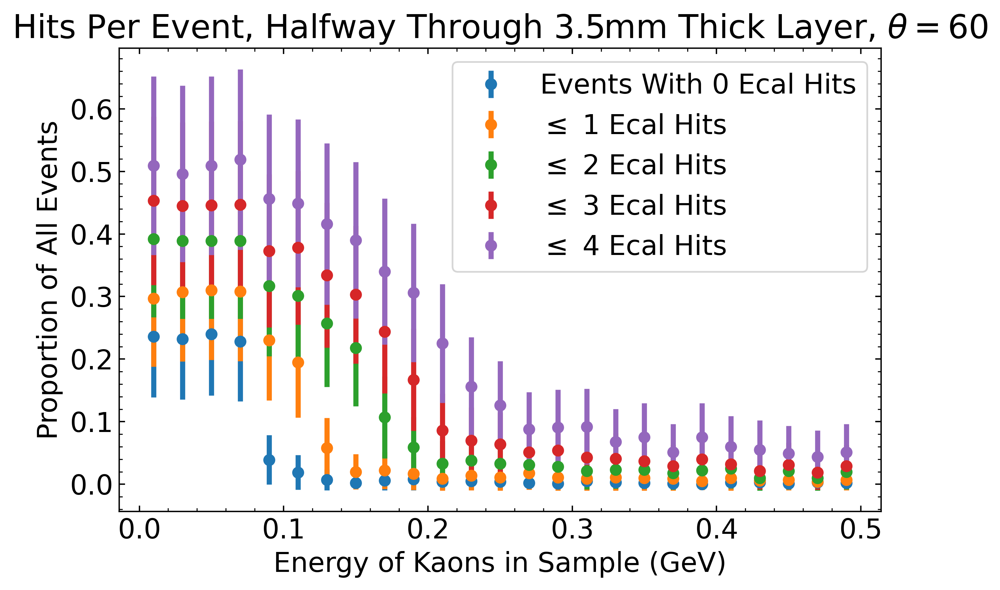

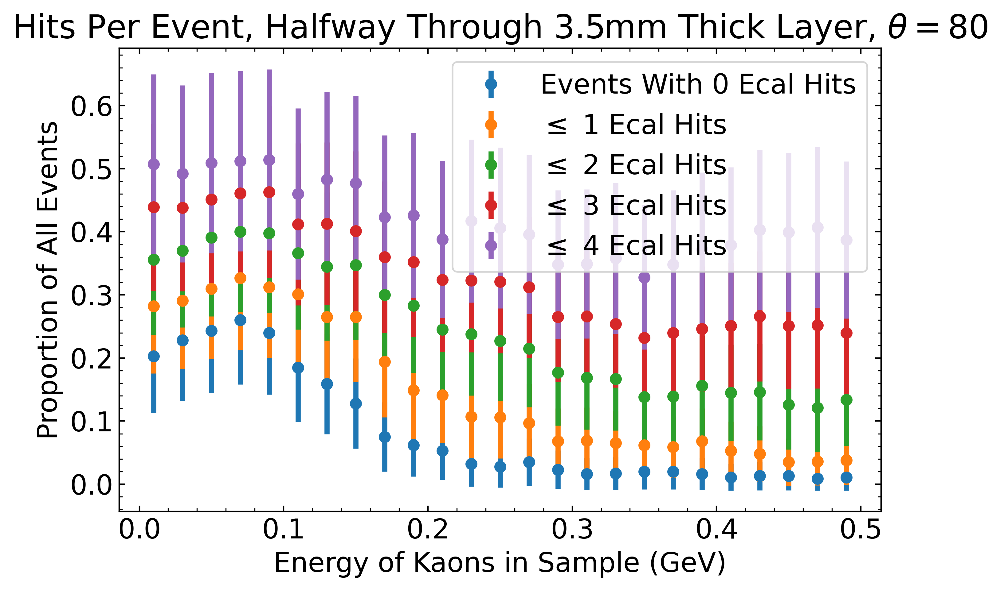

In [11]:
thetas = np.arange(0,100,20)
for i in range(len(thetas)):
    theta = thetas[i]
    # import data
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        energy[i] = thisname[14:18]

    # reload data with dtype float
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f0e = np.sqrt(f0/entries)
    f1 = data[0:,2];
    f1e = np.sqrt(f1/entries)
    f2 = data[0:,3]
    f2e = np.sqrt(f2/entries)
    f3 = data[0:,4]
    f3e = np.sqrt(f3/entries)
    f4 = data[0:,5]
    f4e = np.sqrt(f4/entries)

    plt.figure(figsize=(8,5),dpi=400)
    plt.ylabel("Proportion of All Events")
    plt.xlabel("Energy of Kaons in Sample (GeV)")
    plt.title(r"Hits Per Event, Halfway Through 3.5mm Thick Layer, $\theta = %d$" % theta)
    plt.errorbar(energy,f0,yerr=f0e,marker='o',linestyle='',label='Events With 0 Ecal Hits')
    plt.errorbar(energy,f1,yerr=f1e,marker='o',linestyle='',label=r'$\leq$ 1 Ecal Hits')
    plt.errorbar(energy,f2,yerr=f2e,marker='o',linestyle='',label=r'$\leq$ 2 Ecal Hits')
    plt.errorbar(energy,f3,yerr=f3e,marker='o',linestyle='',label=r'$\leq$ 3 Ecal Hits')
    plt.errorbar(energy,f4,yerr=f4e,marker='o',linestyle='',label=r'$\leq$ 4 Ecal Hits')
    plt.legend()
    plt.savefig("/Users/chris/Desktop/ldmx_plots/newplots_%d_degrees_clayer" % theta)

[0.0, 286.4788975654116, 572.9577951308232, 859.4366926962348, 1145.9155902616465, 1432.3944878270581, 1718.8733853924696, 2005.3522829578812, 2291.831180523293, 2578.3100780887044, 2864.7889756541163, 3151.2678732195277, 3437.746770784939, 3724.225668350351, 4010.7045659157625, 4297.183463481174, 4583.662361046586]
[ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70 75 80]


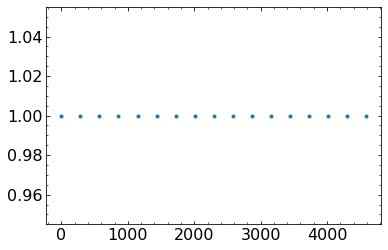

In [9]:
angles_inradians = np.arange(0,85,5)
angles_indegrees = [np.degrees(angles_inradians[i]) for i in range(len(angles_inradians))]
print(angles_indegrees)
print(angles_inradians)
yvals = [1] * 17
plt.plot(angles_indegrees,yvals,'.')

theta is 0, length of fs are: 25, 25, 25, 25, 25
5
10
15
20
25
theta is 20, length of fs are: 25, 25, 25, 25, 25
5
10
15
20
25
theta is 40, length of fs are: 25, 25, 25, 25, 25
5
10
15
20
25
theta is 60, length of fs are: 25, 25, 25, 25, 25
5
10
15
20
24
theta is 80, length of fs are: 25, 25, 25, 25, 25
5
8
10
12
13


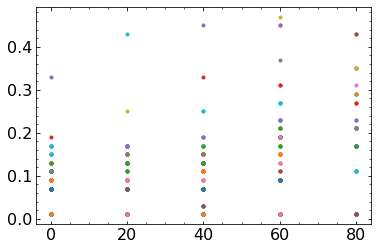

In [18]:
thetas = np.arange(0,100,20)
for i in range(len(thetas)):
    theta = thetas[i]
    # import data
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        energy[i] = thisname[14:18]

    # reload data with dtype float
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f0e = np.sqrt(f0/entries)
    f1 = data[0:,2];
    f1e = np.sqrt(f1/entries)
    f2 = data[0:,3]
    f2e = np.sqrt(f2/entries)
    f3 = data[0:,4]
    f3e = np.sqrt(f3/entries)
    f4 = data[0:,5]
    f4e = np.sqrt(f4/entries)
    
    print("theta is %d, length of fs are: %d, %d, %d, %d, %d" % (theta,len(f0),len(f1),len(f2),len(f3),len(f4)))
    
    E_0hits = []
    E_1hits = []
    E_2hits = []
    E_3hits = []
    E_4hits = []
    
    cutoffs = [0.33,0.2,0.1,0.05,0.02]
    for index in range(len(cutoffs)):
        cutoff = cutoffs[index]
        for i in range(len(f0)): # note all fs have same length, 25
            if f0[i] < cutoff:
                E_0hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f1)): # note all fs have same length, 25
            if f1[i] < cutoff:
                E_1hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f2)): # note all fs have same length, 25
            if f2[i] < cutoff:
                E_2hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f3)): # note all fs have same length, 25
            if f3[i] < cutoff:
                E_3hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f4)): # note all fs have same length, 25
            if f4[i] < cutoff:
                E_4hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        print(len(E_0hits))
        plt.plot(theta,E_0hit_thiscutoff,'.',label=r'$\theta = %d$, 0 hits, cutoff = %.2f' % (theta, cutoff),color='C0')
        plt.plot(theta,E_0hit_thiscutoff,'.',label=r'$\theta = %d$, 0 hits, cutoff = %.2f' % (theta, cutoff))

theta is 0, length of fs are: 25, 25, 25, 25, 25
5
theta is 20, length of fs are: 25, 25, 25, 25, 25
5
theta is 40, length of fs are: 25, 25, 25, 25, 25
5
theta is 60, length of fs are: 25, 25, 25, 25, 25
5


Text(0.5, 1.02, 'Cutoff Parameters for 90% of Events to Produce Hits')

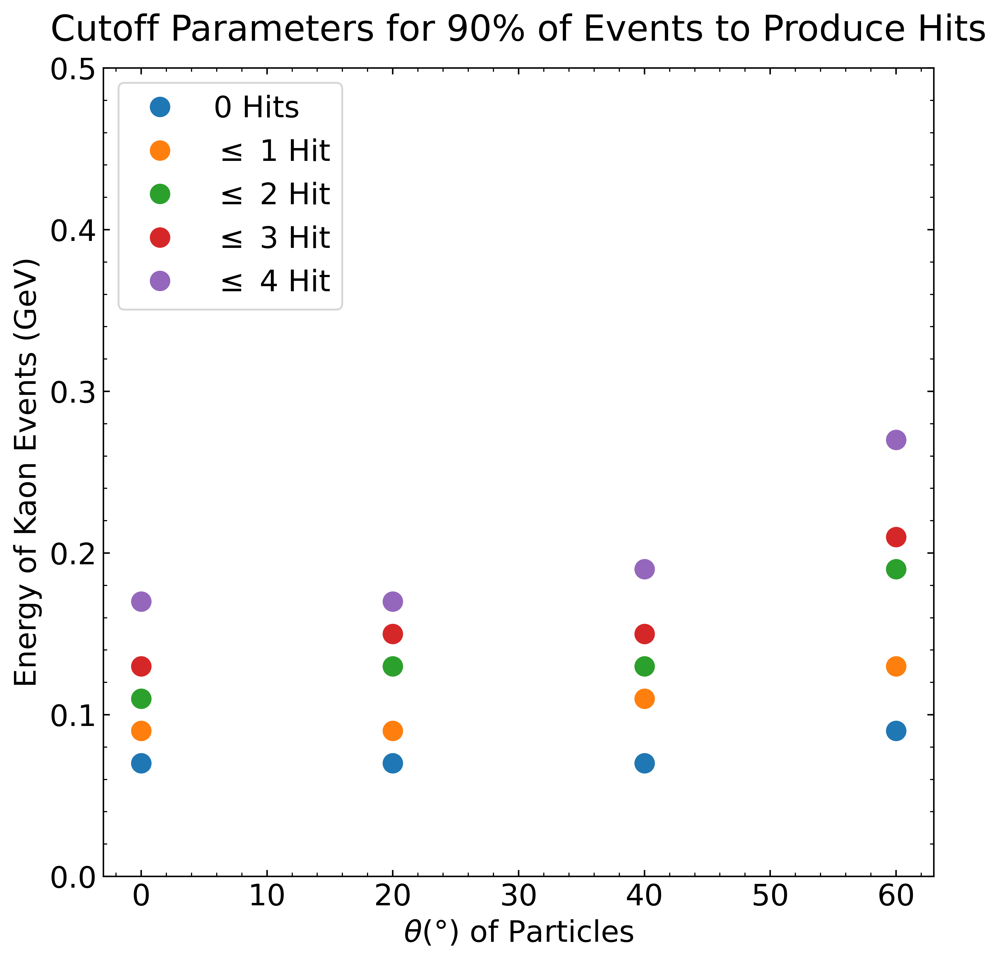

In [48]:
thetas = np.arange(0,80,20)
plt.figure(figsize=(8,8),dpi=500)
for i in range(len(thetas)):
    theta = thetas[i]
    # import data
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        energy[i] = thisname[14:18]

    # reload data with dtype float
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f0e = np.sqrt(f0/entries)
    f1 = data[0:,2];
    f1e = np.sqrt(f1/entries)
    f2 = data[0:,3]
    f2e = np.sqrt(f2/entries)
    f3 = data[0:,4]
    f3e = np.sqrt(f3/entries)
    f4 = data[0:,5]
    f4e = np.sqrt(f4/entries)
    
    print("theta is %d, length of fs are: %d, %d, %d, %d, %d" % (theta,len(f0),len(f1),len(f2),len(f3),len(f4)))
    
    E_0hits = []
    E_1hits = []
    E_2hits = []
    E_3hits = []
    E_4hits = []
    
    cutoffs = [0.1]
    for index in range(1):
        cutoff = cutoffs[index]
        for i in range(len(f0)): # note all fs have same length, 25
            if f0[i] < cutoff:
                E_0hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f1)): # note all fs have same length, 25
            if f1[i] < cutoff:
                E_1hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f2)): # note all fs have same length, 25
            if f2[i] < cutoff:
                E_2hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f3)): # note all fs have same length, 25
            if f3[i] < cutoff:
                E_3hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f4)): # note all fs have same length, 25
            if f4[i] < cutoff:
                E_4hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        print(len(E_0hits))
        plt.plot(theta,E_0hit_thiscutoff,'o',label=r'0 hits',color='C0',markersize='10')
        plt.plot(theta,E_1hit_thiscutoff,'o',label=r'le 1 hit',color='C1',markersize='10')
        plt.plot(theta,E_2hit_thiscutoff,'o',label=r'le 2 hits',color='C2',markersize='10')
        plt.plot(theta,E_3hit_thiscutoff,'o',label=r'le 3 hits',color='C3',markersize='10')
        plt.plot(theta,E_4hit_thiscutoff,'o',label=r'le 4 hits',color='C4',markersize='10')

from matplotlib.lines import Line2D
custom_lines = [Line2D([], [], color='C0', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C1', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C2', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C3', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C4', linestyle='none',marker='o',markersize='10')]
# blue_star = mlines.Line2D([], [], color='blue', marker='*', linestyle='None', markersize=10, label='Blue stars')
plt.legend(custom_lines, ['0 Hits', r'$\leq$ 1 Hit', r'$\leq$ 2 Hit', r'$\leq$ 3 Hit', r'$\leq$ 4 Hit'], loc='upper left')
plt.xlabel(r'$\theta (\degree)$ of Particles')
plt.ylabel('Energy of Kaon Events (GeV)')
plt.ylim(0,0.5)
plt.title("Cutoff Parameters for 90% of Events to Produce Hits", y = 1.02)

theta is 0, length of fs are: 25, 25, 25, 25, 25
5
theta is 20, length of fs are: 25, 25, 25, 25, 25
5
theta is 40, length of fs are: 25, 25, 25, 25, 25
5
theta is 60, length of fs are: 25, 25, 25, 25, 25
5


Text(0.5, 1.02, 'Cutoff Parameters for 95% of Events to Produce Hits')

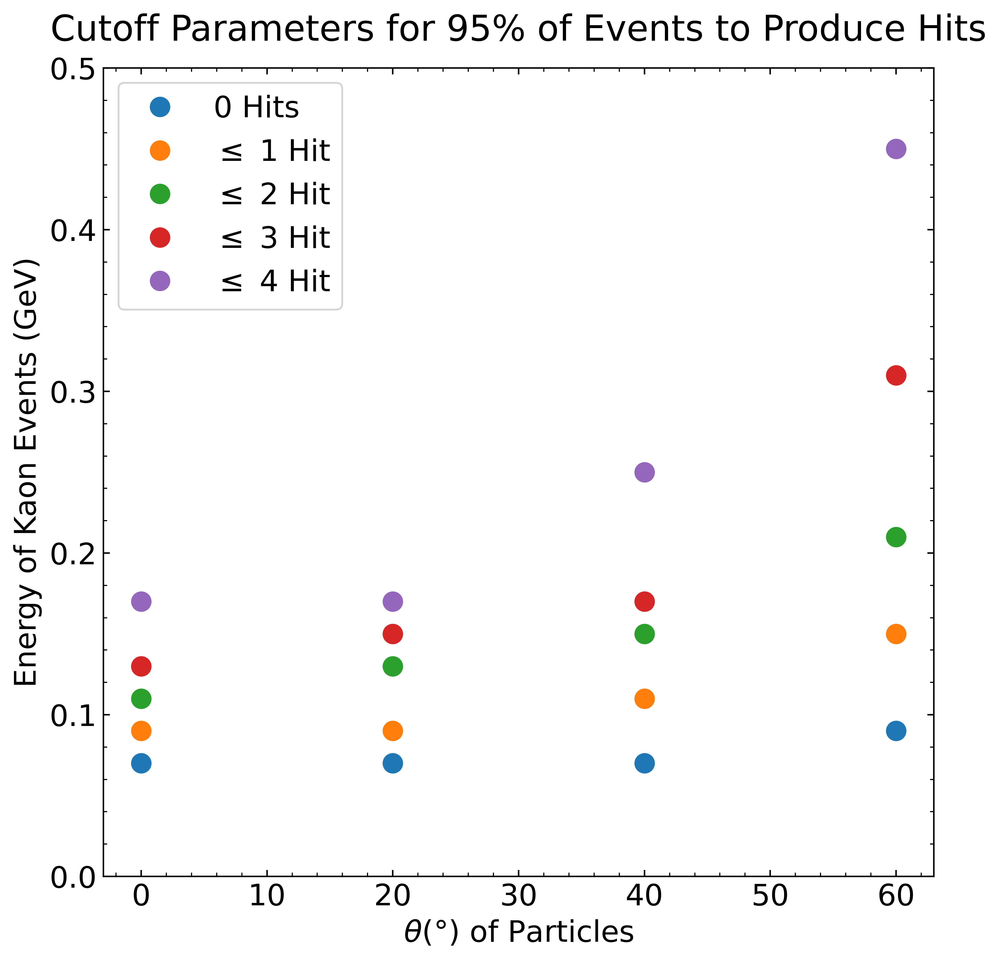

In [47]:
thetas = np.arange(0,80,20)
plt.figure(figsize=(8,8),dpi=500)
for i in range(len(thetas)):
    theta = thetas[i]
    # import data
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        energy[i] = thisname[14:18]

    # reload data with dtype float
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f0e = np.sqrt(f0/entries)
    f1 = data[0:,2];
    f1e = np.sqrt(f1/entries)
    f2 = data[0:,3]
    f2e = np.sqrt(f2/entries)
    f3 = data[0:,4]
    f3e = np.sqrt(f3/entries)
    f4 = data[0:,5]
    f4e = np.sqrt(f4/entries)
    
    print("theta is %d, length of fs are: %d, %d, %d, %d, %d" % (theta,len(f0),len(f1),len(f2),len(f3),len(f4)))
    
    E_0hits = []
    E_1hits = []
    E_2hits = []
    E_3hits = []
    E_4hits = []
    
    cutoffs = [0.05]
    for index in range(1):
        cutoff = cutoffs[index]
        for i in range(len(f0)): # note all fs have same length, 25
            if f0[i] < cutoff:
                E_0hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f1)): # note all fs have same length, 25
            if f1[i] < cutoff:
                E_1hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f2)): # note all fs have same length, 25
            if f2[i] < cutoff:
                E_2hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f3)): # note all fs have same length, 25
            if f3[i] < cutoff:
                E_3hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f4)): # note all fs have same length, 25
            if f4[i] < cutoff:
                E_4hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        print(len(E_0hits))
        plt.plot(theta,E_0hit_thiscutoff,'o',label=r'0 hits',color='C0',markersize='10')
        plt.plot(theta,E_1hit_thiscutoff,'o',label=r'le 1 hit',color='C1',markersize='10')
        plt.plot(theta,E_2hit_thiscutoff,'o',label=r'le 2 hits',color='C2',markersize='10')
        plt.plot(theta,E_3hit_thiscutoff,'o',label=r'le 3 hits',color='C3',markersize='10')
        plt.plot(theta,E_4hit_thiscutoff,'o',label=r'le 4 hits',color='C4',markersize='10')

from matplotlib.lines import Line2D
custom_lines = [Line2D([], [], color='C0', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C1', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C2', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C3', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C4', linestyle='none',marker='o',markersize='10')]
# blue_star = mlines.Line2D([], [], color='blue', marker='*', linestyle='None', markersize=10, label='Blue stars')
plt.legend(custom_lines, ['0 Hits', r'$\leq$ 1 Hit', r'$\leq$ 2 Hit', r'$\leq$ 3 Hit', r'$\leq$ 4 Hit'])
plt.xlabel(r'$\theta (\degree)$ of Particles')
plt.ylabel('Energy of Kaon Events (GeV)')
plt.ylim(0,0.5)
plt.title("Cutoff Parameters for 95% of Events to Produce Hits", y = 1.02)

theta is 0, length of fs are: 25, 25, 25, 25, 25
5
theta is 20, length of fs are: 25, 25, 25, 25, 25
5
theta is 40, length of fs are: 25, 25, 25, 25, 25
5
theta is 60, length of fs are: 25, 25, 25, 25, 25
4


Text(0.5, 1.02, 'Cutoff Parameters for 98% of Events in a Kaon Gun Sample to Produce Hits')

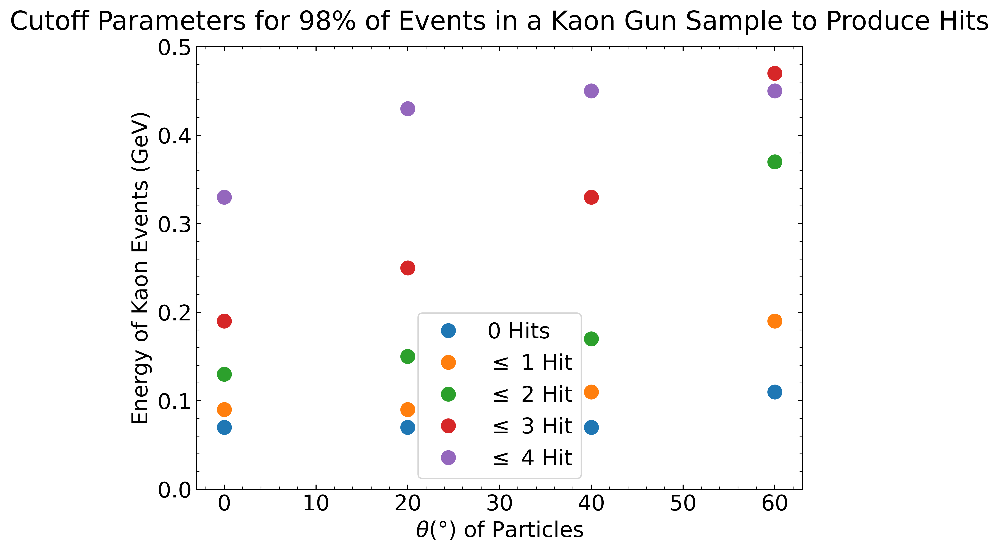

In [45]:
thetas = np.arange(0,80,20)
plt.figure(figsize=(8,8),dpi=500)
for i in range(len(thetas)):
    theta = thetas[i]
    # import data
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=str)
    # first column are names
    name = data[0:,0]
    entries = len(name)
    # energy packed into string
    energy = np.zeros(entries)
    for i in range(len(name)):
        thisname = name[i]
        # clean up shorter entries such as 0.3gev
        energy[i] = thisname[14:18]

    # reload data with dtype float
    data = np.genfromtxt('/Users/chris/Desktop/clayer_midway_samples/%d_numhits.txt' % theta,delimiter=',',dtype=float)

    f0 = data[0:,1]
    f0e = np.sqrt(f0/entries)
    f1 = data[0:,2];
    f1e = np.sqrt(f1/entries)
    f2 = data[0:,3]
    f2e = np.sqrt(f2/entries)
    f3 = data[0:,4]
    f3e = np.sqrt(f3/entries)
    f4 = data[0:,5]
    f4e = np.sqrt(f4/entries)
    
    print("theta is %d, length of fs are: %d, %d, %d, %d, %d" % (theta,len(f0),len(f1),len(f2),len(f3),len(f4)))
    
    E_0hits = []
    E_1hits = []
    E_2hits = []
    E_3hits = []
    E_4hits = []
    
    cutoffs = [0.02]
    for index in range(1):
        cutoff = cutoffs[index]
        for i in range(len(f0)): # note all fs have same length, 25
            if f0[i] < cutoff:
                E_0hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f1)): # note all fs have same length, 25
            if f1[i] < cutoff:
                E_1hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f2)): # note all fs have same length, 25
            if f2[i] < cutoff:
                E_2hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f3)): # note all fs have same length, 25
            if f3[i] < cutoff:
                E_3hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        for i in range(len(f4)): # note all fs have same length, 25
            if f4[i] < cutoff:
                E_4hit_thiscutoff = energy[i]
                E_0hits.append(energy[i])
                break
        print(len(E_0hits))
        plt.plot(theta,E_0hit_thiscutoff,'o',label=r'0 hits',color='C0',markersize='10')
        plt.plot(theta,E_1hit_thiscutoff,'o',label=r'le 1 hit',color='C1',markersize='10')
        plt.plot(theta,E_2hit_thiscutoff,'o',label=r'le 2 hits',color='C2',markersize='10')
        plt.plot(theta,E_3hit_thiscutoff,'o',label=r'le 3 hits',color='C3',markersize='10')
        plt.plot(theta,E_4hit_thiscutoff,'o',label=r'le 4 hits',color='C4',markersize='10')

from matplotlib.lines import Line2D
custom_lines = [Line2D([], [], color='C0', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C1', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C2', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C3', linestyle='none',marker='o',markersize='10'),
                Line2D([], [], color='C4', linestyle='none',marker='o',markersize='10')]
# blue_star = mlines.Line2D([], [], color='blue', marker='*', linestyle='None', markersize=10, label='Blue stars')
plt.legend(custom_lines, ['0 Hits', r'$\leq$ 1 Hit', r'$\leq$ 2 Hit', r'$\leq$ 3 Hit', r'$\leq$ 4 Hit'])
plt.xlabel(r'$\theta (\degree)$ of Particles')
plt.ylabel('Energy of Kaon Events (GeV)')
plt.ylim(0,0.5)
plt.title("Cutoff Parameters for 98% of Events in a Kaon Gun Sample to Produce Hits", y = 1.02)